# TP Aprendizaje No Supervisado - Grupo 14

## Integrantes

  * Gisela Brunetto  
  * Andres Luna  
  * Guillermo Robiglio  
  * Alejandro Garay  

## Consigna

Práctico entregable: 
Utilizar la base de jugadores “players_22.csv” disponible en la página de Kaggle https://www.kaggle.com/datasets/stefanoleone992/fifa-22-complete-player-dataset . Considerar que la base 2022 no tiene el mismo formato que la base vista en clase, a los nombres de las variables se les agregó una keyword para identificar a qué tipo de habilidad corresponde.

Con la nueva base, realizar un análisis análogo al que realizamos en el cursado de la materia con los datos FIFA2019. Realice comentarios en cada parte (verbose=True ;))

1. Análisis exploratorio de la base.
2. Evaluación visual  e intuitiva de a dos variables numéricas por vez.
3. Uso de dos técnicas de clustering: por ejemplo k-medias, DBSCAN, mezcla de Gaussianas y/o alguna jerárquica. Elección justificada de hiper-parámetros
4. Evaluación y Análisis de los clusters encontrados.
5. Pregunta: ¿Se realizó alguna normalización o escalado de la base? ¿Por qué ?
6. Uso de alguna transformación (proyección, Embedding) para visualizar los resultados y/o usarla como preprocesado para aplicar alguna técnica de clustering.

## Referencias

[Explicación de los atributos](https://www.fifplay.com/fifa-22-player-attributes/)

[Lista de atributos y escalas](https://www.fifplay.com/encyclopedia/player-attributes/)


## Importaciones

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D
import plotly.graph_objs as go
import random

## Detección del entorno

Este código detecta si el notebook se está ejecutando en Jupyter o Google Colab. Esto es necesario porque hay comandos que funcionan diferente o no funcionan, dependiendo del entorno.

In [2]:
def is_notebook() -> bool:
    try:
        shell = get_ipython().__class__.__name__
        if shell == 'ZMQInteractiveShell':
            print('El código se etá ejecutando en Jupyter Notebook.')
            return True   # Jupyter Notebook
        elif shell == 'TerminalInteractiveShell':
            return False  # IPython ejecutándose desde la Terminal
        else:
            print('Probablemente el código se esté ejecutando en Google Colab.')
            return False  # Probablemente Google Colab u otro entorno
    except NameError:
        return False      # Probablemente intérprete estándar de Python
    
jupyter = is_notebook()

El código se etá ejecutando en Jupyter Notebook.


In [3]:
# Esto es para obtener gráficos interactivos en Jupyter Notebook.
# Entre otras cosas, los gráficos interactivos permiter hacer rotaciones 3D.
if jupyter:
    interactivos = input('¿Querés que los gráficos sean interactivos (S/n)')
    if interactivos.lower() == 's':
        %matplotlib notebook

¿Querés que los gráficos sean interactivos (S/n)n


## Constantes

In [4]:
ARCHIVO = './players_22.csv'
URL = 'https://raw.githubusercontent.com/alejandroggaray/DiploDatos/main/01-NoSupervisado/players_22.csv'

## Exploración de la base

In [7]:
if jupyter:
    df = pd.read_csv(ARCHIVO, low_memory=False) # En caso de utilizar Jupyter Notebook
else:
    df = pd.read_csv(URL) # En caso de utilizar Google Colab
df.head(10)

,sofifa_id,player_url,short_name,long_name,player_positions,overall,potential,value_eur,wage_eur,age,...,lcb,cb,rcb,rb,gk,player_face_url,club_logo_url,club_flag_url,nation_logo_url,nation_flag_url
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,"RW, ST, CF",93,93,78000000.0,320000.0,34,...,50+3,50+3,50+3,61+3,19+3,https://cdn.sofifa.net/players/158/023/22_120.png,https://cdn.sofifa.net/teams/73/60.png,https://cdn.sofifa.net/flags/fr.png,https://cdn.sofifa.net/teams/1369/60.png,https://cdn.sofifa.net/flags/ar.png
1,188545,https://sofifa.com/player/188545/robert-lewand...,R. Lewandowski,Robert Lewandowski,ST,92,92,119500000.0,270000.0,32,...,60+3,60+3,60+3,61+3,19+3,https://cdn.sofifa.net/players/188/545/22_120.png,https://cdn.sofifa.net/teams/21/60.png,https://cdn.sofifa.net/flags/de.png,https://cdn.sofifa.net/teams/1353/60.png,https://cdn.sofifa.net/flags/pl.png
2,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,"ST, LW",91,91,45000000.0,270000.0,36,...,53+3,53+3,53+3,60+3,20+3,https://cdn.sofifa.net/players/020/801/22_120.png,https://cdn.sofifa.net/teams/11/60.png,https://cdn.sofifa.net/flags/gb-eng.png,https://cdn.sofifa.net/teams/1354/60.png,https://cdn.sofifa.net/flags/pt.png
3,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Júnior,"LW, CAM",91,91,129000000.0,270000.0,29,...,50+3,50+3,50+3,62+3,20+3,https://cdn.sofifa.net/players/190/871/22_120.png,https://cdn.sofifa.net/teams/73/60.png,https://cdn.sofifa.net/flags/fr.png,NaN,https://cdn.sofifa.net/flags/br.png
4,192985,https://sofifa.com/player/192985/kevin-de-bruy...,K. De Bruyne,Kevin De Bruyne,"CM, CAM",91,91,125500000.0,350000.0,30,...,69+3,69+3,69+3,75+3,21+3,https://cdn.sofifa.net/players/192/985/22_120.png,https://cdn.sofifa.net/teams/10/60.png,https://cdn.sofifa.net/flags/gb-eng.png,https://cdn.sofifa.net/teams/1325/60.png,https://cdn.sofifa.net/flags/be.png
5,200389,https://sofifa.com/player/200389/jan-oblak/220002,J. Oblak,Jan Oblak,GK,91,93,112000000.0,130000.0,28,...,33+3,33+3,33+3,32+3,89+3,https://cdn.sofifa.net/players/200/389/22_120.png,https://cdn.sofifa.net/teams/240/60.png,https://cdn.sofifa.net/flags/es.png,NaN,https://cdn.sofifa.net/flags/si.png
6,231747,https://sofifa.com/player/231747/kylian-mbappe...,K. Mbappé,Kylian Mbappé Lottin,"ST, LW",91,95,194000000.0,230000.0,22,...,54+3,54+3,54+3,63+3,18+3,https://cdn.sofifa.net/players/231/747/22_120.png,https://cdn.sofifa.net/teams/73/60.png,https://cdn.sofifa.net/flags/fr.png,https://cdn.sofifa.net/teams/1335/60.png,https://cdn.sofifa.net/flags/fr.png
7,167495,https://sofifa.com/player/167495/manuel-neuer/...,M. Neuer,Manuel Peter Neuer,GK,90,90,13500000.0,86000.0,35,...,34+3,34+3,34+3,35+3,88+2,https://cdn.sofifa.net/players/167/495/22_120.png,https://cdn.sofifa.net/teams/21/60.png,https://cdn.sofifa.net/flags/de.png,https://cdn.sofifa.net/teams/1337/60.png,https://cdn.sofifa.net/flags/de.png
8,192448,https://sofifa.com/player/192448/marc-andre-te...,M. ter Stegen,Marc-André ter Stegen,GK,90,92,99000000.0,250000.0,29,...,33+3,33+3,33+3,31+3,88+3,https://cdn.sofifa.net/players/192/448/22_120.png,https://cdn.sofifa.net/teams/241/60.png,https://cdn.sofifa.net/flags/es.png,NaN,https://cdn.sofifa.net/flags/de.png
9,202126,https://sofifa.com/player/202126/harry-kane/22...,H. Kane,Harry Kane,ST,90,90,129500000.0,240000.0,27,...,61+3,61+3,61+3,64+3,20+3,https://cdn.sofifa.net/players/202/126/22_120.png,https://cdn.sofifa.net/teams/18/60.png,https://cdn.sofifa.net/flags/gb-eng.png,https://cdn.sofifa.net/teams/1318/60.png,https://cdn.sofifa.net/flags/gb-eng.png


A continuación se listan las 110 características que posee el dataset.

In [8]:
cols = df.columns
for i, col in enumerate(cols):
    print (f'{i} - {col}')

0 - sofifa_id
1 - player_url
2 - short_name
3 - long_name
4 - player_positions
5 - overall
6 - potential
7 - value_eur
8 - wage_eur
9 - age
10 - dob
11 - height_cm
12 - weight_kg
13 - club_team_id
14 - club_name
15 - league_name
16 - league_level
17 - club_position
18 - club_jersey_number
19 - club_loaned_from
20 - club_joined
21 - club_contract_valid_until
22 - nationality_id
23 - nationality_name
24 - nation_team_id
25 - nation_position
26 - nation_jersey_number
27 - preferred_foot
28 - weak_foot
29 - skill_moves
30 - international_reputation
31 - work_rate
32 - body_type
33 - real_face
34 - release_clause_eur
35 - player_tags
36 - player_traits
37 - pace
38 - shooting
39 - passing
40 - dribbling
41 - defending
42 - physic
43 - attacking_crossing
44 - attacking_finishing
45 - attacking_heading_accuracy
46 - attacking_short_passing
47 - attacking_volleys
48 - skill_dribbling
49 - skill_curve
50 - skill_fk_accuracy
51 - skill_long_passing
52 - skill_ball_control
53 - movement_accelerat

In [9]:
print(df.describe())

           sofifa_id       overall     potential     value_eur       wage_eur  \
count   19239.000000  19239.000000  19239.000000  1.916500e+04   19178.000000   
mean   231468.086959     65.772182     71.079370  2.850452e+06    9017.989363   
std     27039.717497      6.880232      6.086213  7.613700e+06   19470.176724   
min        41.000000     47.000000     49.000000  9.000000e+03     500.000000   
25%    214413.500000     61.000000     67.000000  4.750000e+05    1000.000000   
50%    236543.000000     66.000000     71.000000  9.750000e+05    3000.000000   
75%    253532.500000     70.000000     75.000000  2.000000e+06    8000.000000   
max    264640.000000     93.000000     95.000000  1.940000e+08  350000.000000   

                age     height_cm     weight_kg   club_team_id  league_level  \
count  19239.000000  19239.000000  19239.000000   19178.000000  19178.000000   
mean      25.210822    181.299704     74.943032   50580.498123      1.354364   
std        4.748235      6.863

Se realizará un análisis basado en 34 atributos de los jugadores, esto es las características 43 a 76 inclusive.

La elección de estos atributos obedece a que son los listados y explicados [aquí](https://www.fifplay.com/fifa-22-player-attributes/).

Se confecciona un dataset con los atributos (características 43 a 76), para posterior análisis. Dicho dataset no posee valores nulos, asimismo consta de valores numéricos que no requieren escalado, dado de que se trata de valores que expresan una habilidad del jugador en una escala entre 0 y 100.

In [10]:
attributes = cols[43:77]
df_attributes = df[attributes]
df_attributes.head()

,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,...,mentality_penalties,mentality_composure,defending_marking_awareness,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
0,85,95,70,91,88,96,93,94,91,96,...,75,96,20,35,24,6,11,15,14,8
1,71,95,90,85,89,85,79,85,70,88,...,90,88,35,42,19,15,6,12,8,10
2,87,95,90,80,86,88,81,84,77,88,...,88,95,24,32,24,7,11,15,14,11
3,85,83,63,86,86,95,88,87,81,95,...,93,93,35,32,29,9,9,15,15,11
4,94,82,55,94,82,88,85,83,93,91,...,83,89,68,65,53,15,13,5,10,13


In [11]:
df_attributes.isna().sum()

attacking_crossing             0
attacking_finishing            0
attacking_heading_accuracy     0
attacking_short_passing        0
attacking_volleys              0
skill_dribbling                0
skill_curve                    0
skill_fk_accuracy              0
skill_long_passing             0
skill_ball_control             0
movement_acceleration          0
movement_sprint_speed          0
movement_agility               0
movement_reactions             0
movement_balance               0
power_shot_power               0
power_jumping                  0
power_stamina                  0
power_strength                 0
power_long_shots               0
mentality_aggression           0
mentality_interceptions        0
mentality_positioning          0
mentality_vision               0
mentality_penalties            0
mentality_composure            0
defending_marking_awareness    0
defending_standing_tackle      0
defending_sliding_tackle       0
goalkeeping_diving             0
goalkeepin

Tipo de variables

Categóricas

In [12]:
categorical = [var for var in df_attributes.columns if df_attributes[var].dtype=='O'] 
categorical

[]

In [13]:
numerical = [var for var in df_attributes.columns if (df_attributes[var].dtype == float) or (df_attributes[var].dtype == int)]
numerical

[]

Para una mejor comprensión del dataset se presentan 7 conjuntos de gráficos en los que se visualizan características de a pares.

In [14]:
# Identificación de categorías
attr_by_cat = [[attribute.split(sep='_', maxsplit=1)[0], attribute] for attribute in attributes]
categories = set([attribute[0] for attribute in attr_by_cat])

# Lista de diccionarios de datasets organizados por categoría
df_by_cat = []
for cat in categories:
    attr = [x[1] for x in attr_by_cat if cat in x]
    df_by_cat.append({'categoria': cat,
                      'dataset': df_attributes[attr]})

0 - Pairplot de los atributos que corresponden a la categoría defending.


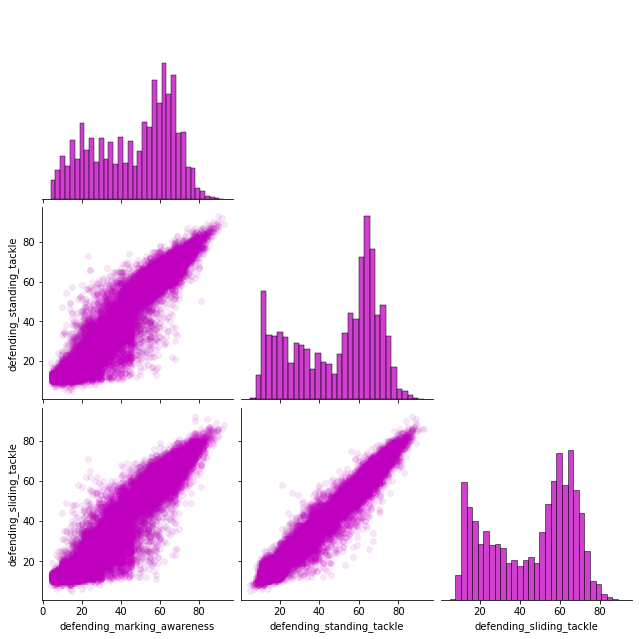

1 - Pairplot de los atributos que corresponden a la categoría power.


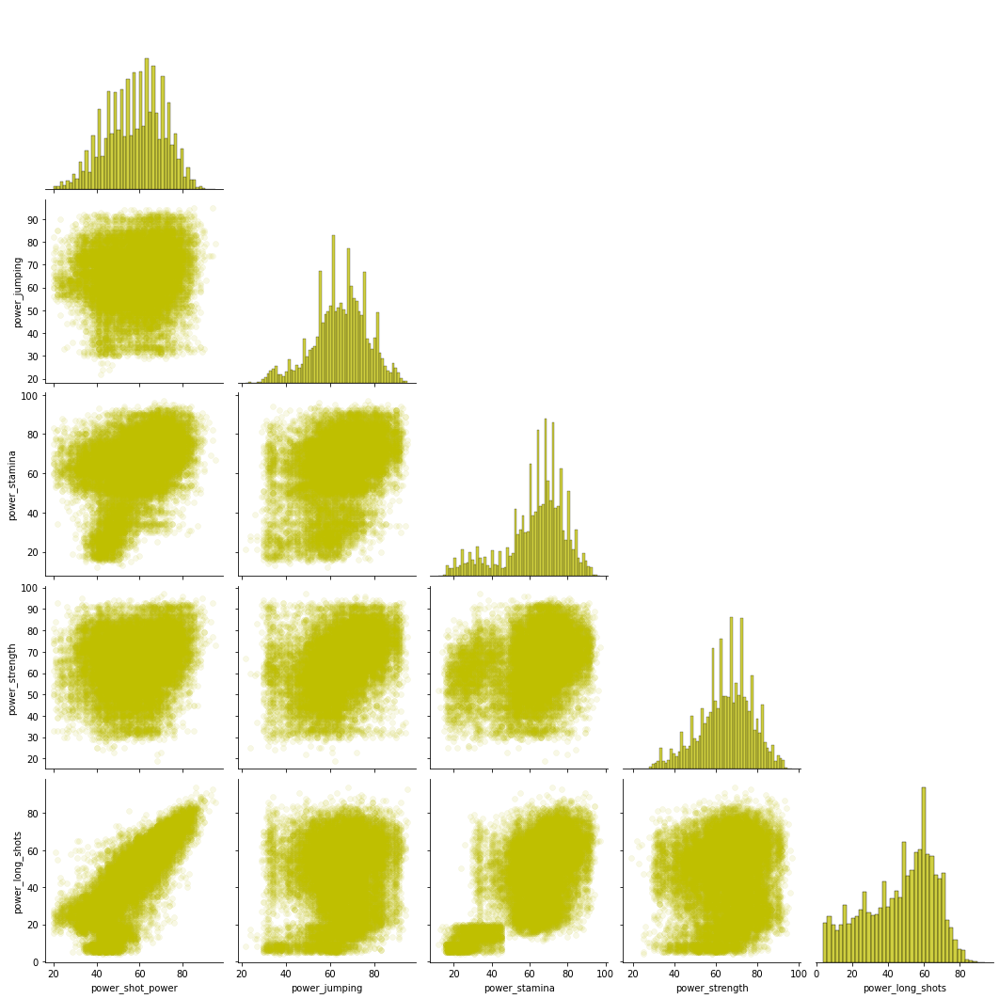

2 - Pairplot de los atributos que corresponden a la categoría mentality.


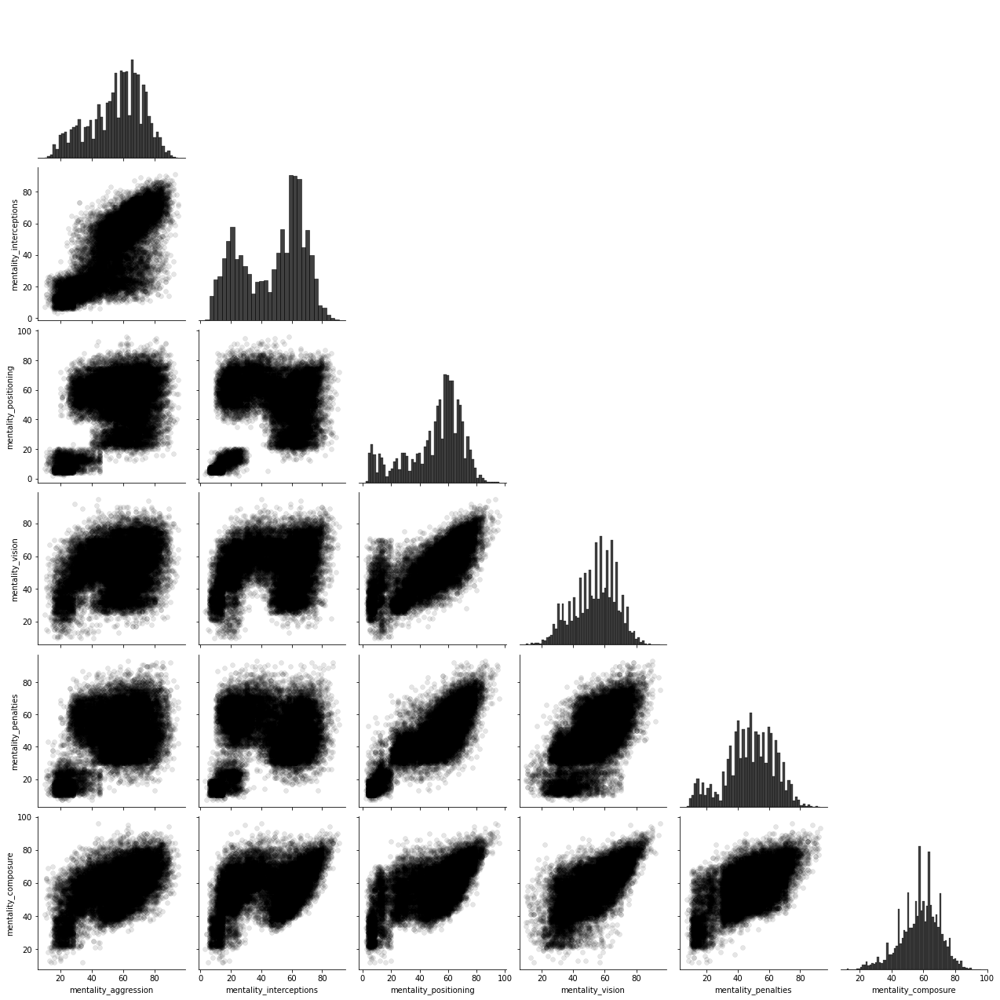

3 - Pairplot de los atributos que corresponden a la categoría movement.


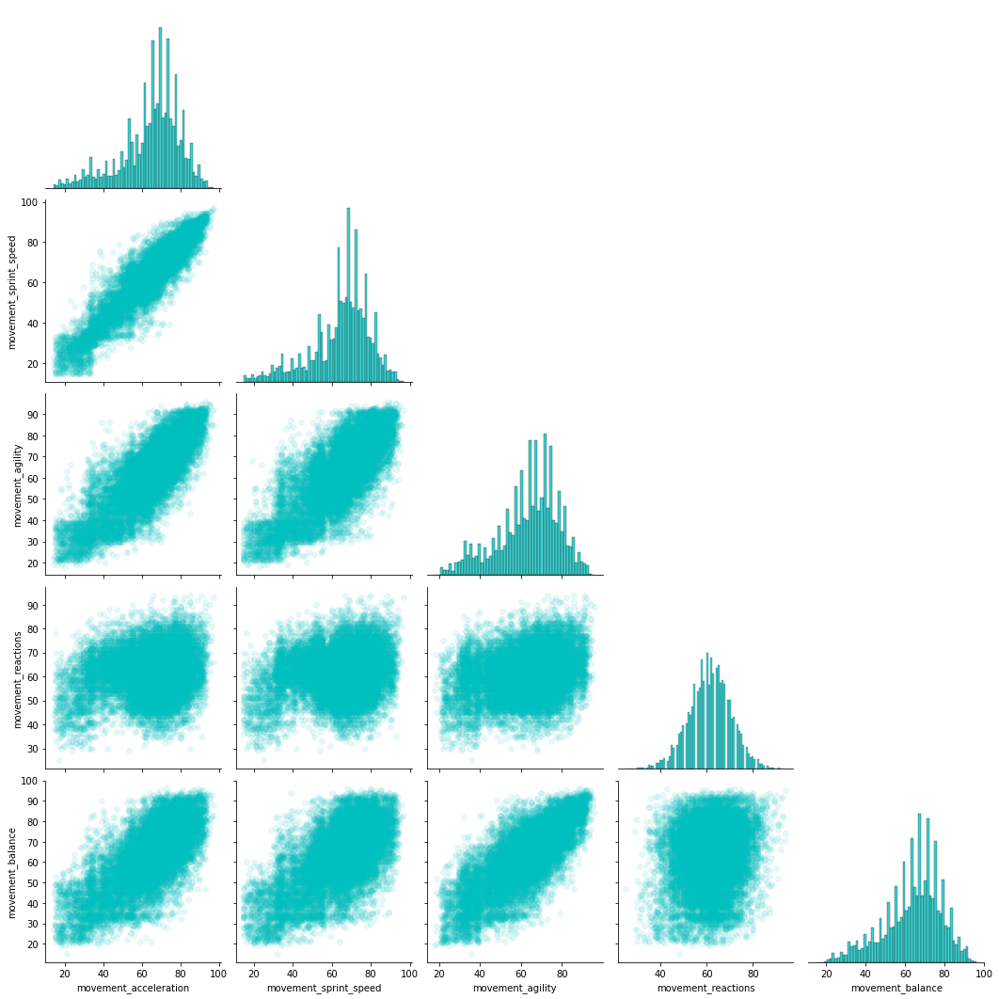

4 - Pairplot de los atributos que corresponden a la categoría skill.


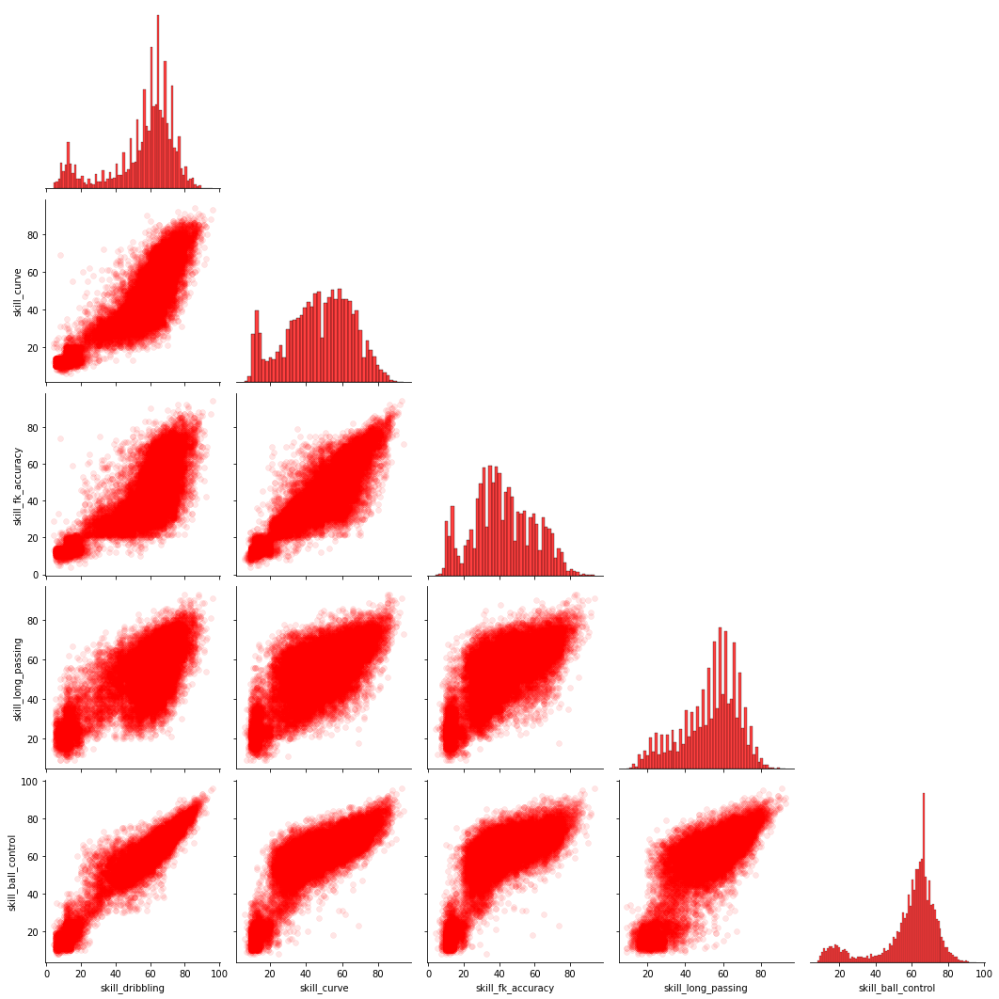

5 - Pairplot de los atributos que corresponden a la categoría goalkeeping.


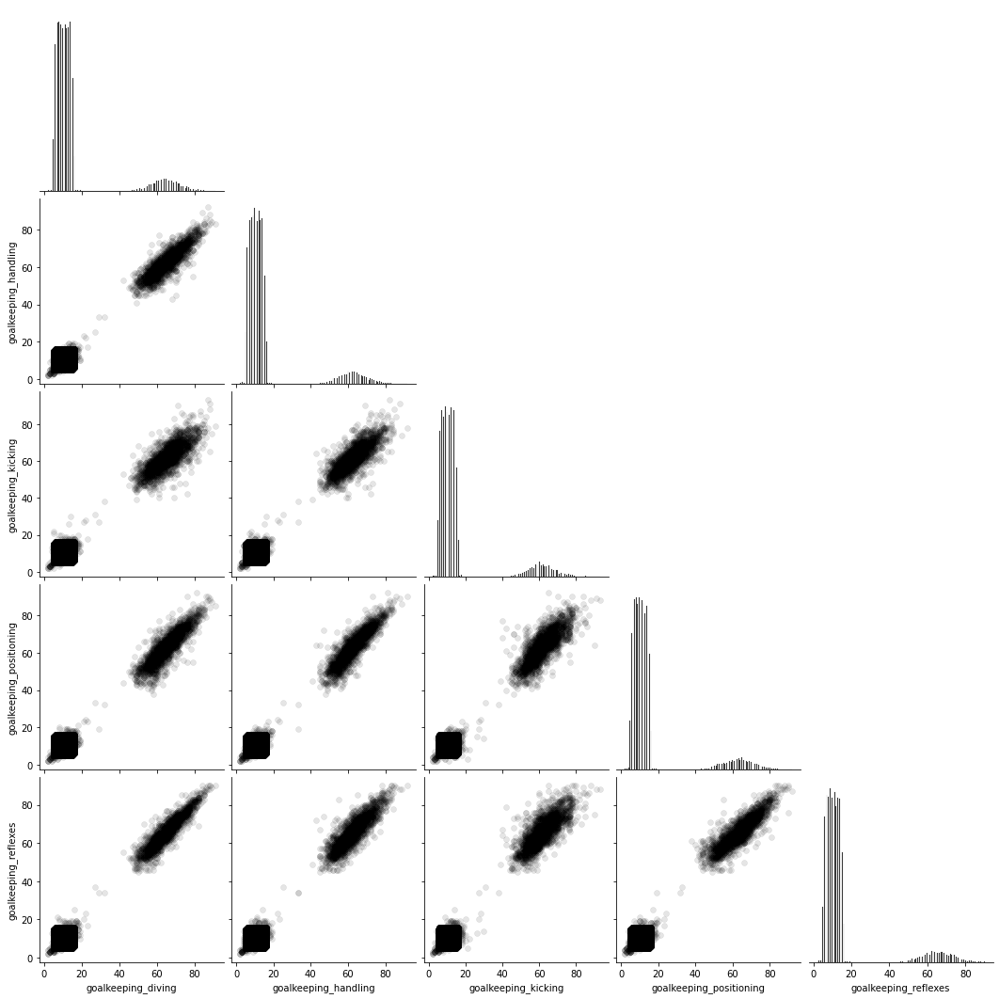

6 - Pairplot de los atributos que corresponden a la categoría attacking.


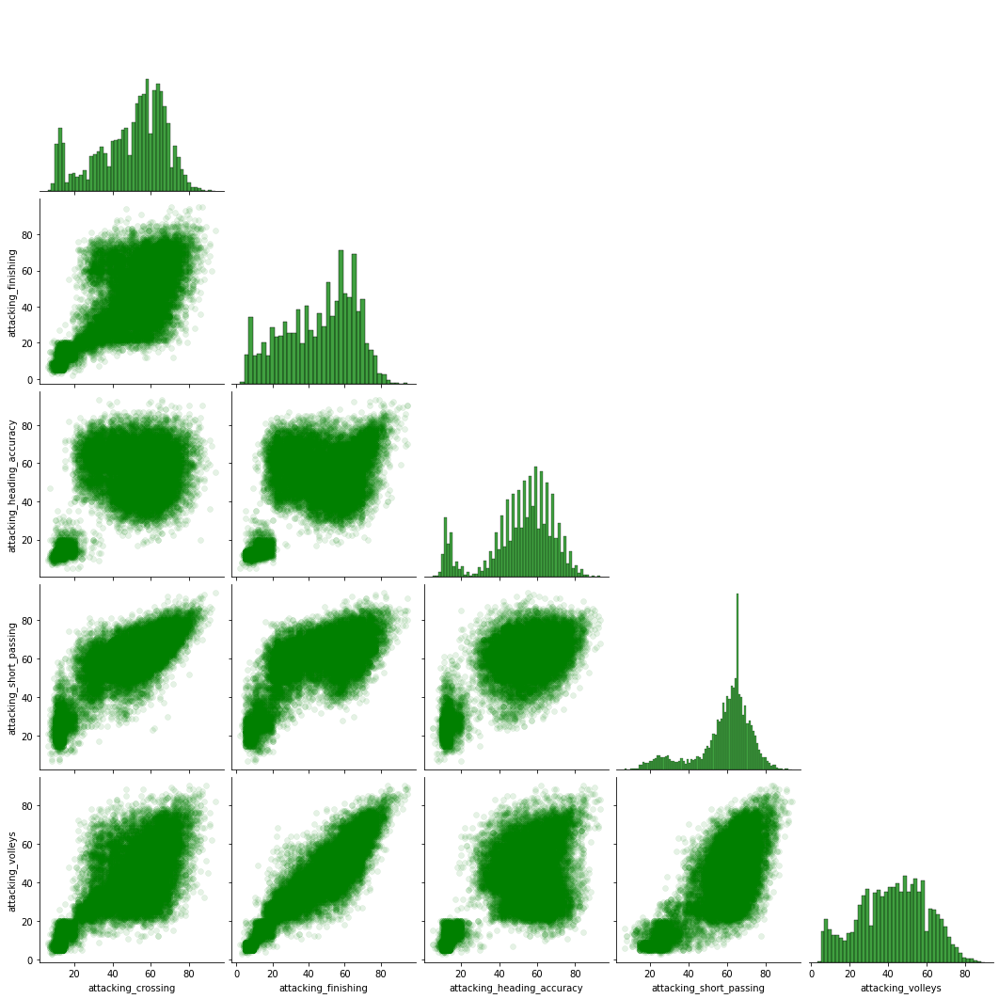

Wall time: 1min 3s


In [15]:
%%time
colores = ['b', 'g', 'r', 'c', 'm', 'y', 'k']
# Pairplots por categorías
for i, dataset in enumerate(df_by_cat):
    print(f"{i} - Pairplot de los atributos que corresponden a la categoría {dataset['categoria']}.")
    color = random.choice(colores)
    sns.pairplot(dataset['dataset'],
                 height=3,
                 plot_kws={'alpha': 0.1, 'edgecolor': 'face', 'color': color},
                 diag_kws={'color': color},
                 corner=True)
    plt.show()

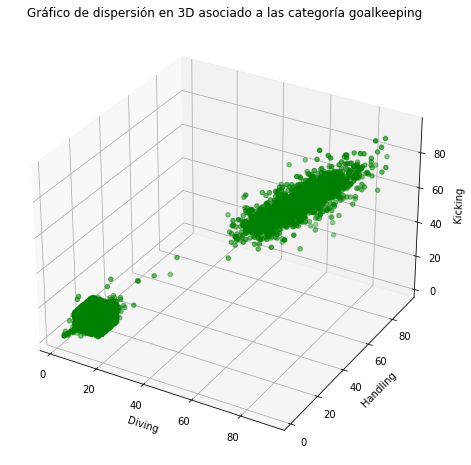

In [16]:
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(xs = df_attributes.goalkeeping_diving,
           ys = df_attributes.goalkeeping_handling,
           zs = df_attributes.goalkeeping_kicking,
           color = random.choice(colores))
ax.set_xlabel('Diving')
ax.set_ylabel('Handling')
ax.set_zlabel('Kicking')
plt.title('Gráfico de dispersión en 3D asociado a las categoría goalkeeping')
plt.show()

Las variables asociadas a la categoría goalkeeping, claramente separan los arqueros de los que no lo son.

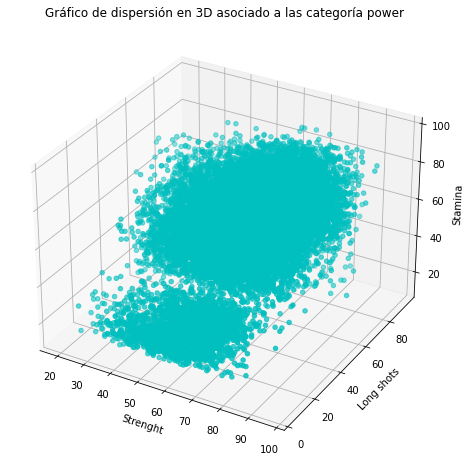

In [17]:
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(xs = df_attributes.power_strength,
           ys = df_attributes.power_long_shots,
           zs = df_attributes.power_stamina,
           color = random.choice(colores))
ax.set_xlabel('Strenght')
ax.set_ylabel('Long shots')
ax.set_zlabel('Stamina')
plt.title('Gráfico de dispersión en 3D asociado a las categoría power')
plt.show()

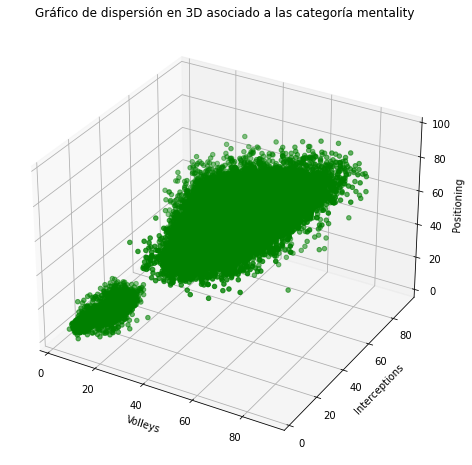

In [18]:
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(xs = df_attributes.attacking_volleys ,
           ys = df_attributes.mentality_interceptions,
           zs = df_attributes.mentality_positioning,
           color = random.choice(colores))
ax.set_xlabel('Volleys')
ax.set_ylabel('Interceptions')
ax.set_zlabel('Positioning')
plt.title('Gráfico de dispersión en 3D asociado a las categoría mentality')
plt.show()

A partir de los gráficos tanto en 2D como en 3D, vemos que sólo podemos diferenciar 2 grupos, que por conocimiento se puede sospechar que uno de ellos es un grupo correspondiente a los arqueros (GK). Esto se puede ver reflejado cuando filtramos el dataset para todas posiciones de jugadores distintos a GK observandosé en los gráficos un sólo conglomerado, tal como se muestra a continuación.

In [19]:
mask= df.player_positions != 'GK'
df_no_GK=df[mask]
df_no_GK.head()

,sofifa_id,player_url,short_name,long_name,player_positions,overall,potential,value_eur,wage_eur,age,...,lcb,cb,rcb,rb,gk,player_face_url,club_logo_url,club_flag_url,nation_logo_url,nation_flag_url
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,"RW, ST, CF",93,93,78000000.0,320000.0,34,...,50+3,50+3,50+3,61+3,19+3,https://cdn.sofifa.net/players/158/023/22_120.png,https://cdn.sofifa.net/teams/73/60.png,https://cdn.sofifa.net/flags/fr.png,https://cdn.sofifa.net/teams/1369/60.png,https://cdn.sofifa.net/flags/ar.png
1,188545,https://sofifa.com/player/188545/robert-lewand...,R. Lewandowski,Robert Lewandowski,ST,92,92,119500000.0,270000.0,32,...,60+3,60+3,60+3,61+3,19+3,https://cdn.sofifa.net/players/188/545/22_120.png,https://cdn.sofifa.net/teams/21/60.png,https://cdn.sofifa.net/flags/de.png,https://cdn.sofifa.net/teams/1353/60.png,https://cdn.sofifa.net/flags/pl.png
2,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,"ST, LW",91,91,45000000.0,270000.0,36,...,53+3,53+3,53+3,60+3,20+3,https://cdn.sofifa.net/players/020/801/22_120.png,https://cdn.sofifa.net/teams/11/60.png,https://cdn.sofifa.net/flags/gb-eng.png,https://cdn.sofifa.net/teams/1354/60.png,https://cdn.sofifa.net/flags/pt.png
3,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Júnior,"LW, CAM",91,91,129000000.0,270000.0,29,...,50+3,50+3,50+3,62+3,20+3,https://cdn.sofifa.net/players/190/871/22_120.png,https://cdn.sofifa.net/teams/73/60.png,https://cdn.sofifa.net/flags/fr.png,NaN,https://cdn.sofifa.net/flags/br.png
4,192985,https://sofifa.com/player/192985/kevin-de-bruy...,K. De Bruyne,Kevin De Bruyne,"CM, CAM",91,91,125500000.0,350000.0,30,...,69+3,69+3,69+3,75+3,21+3,https://cdn.sofifa.net/players/192/985/22_120.png,https://cdn.sofifa.net/teams/10/60.png,https://cdn.sofifa.net/flags/gb-eng.png,https://cdn.sofifa.net/teams/1325/60.png,https://cdn.sofifa.net/flags/be.png


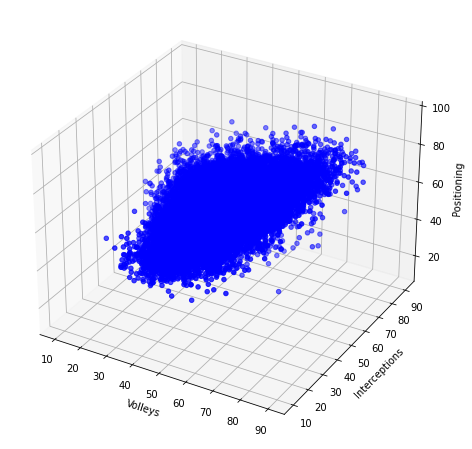

In [20]:
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(xs = df_no_GK.attacking_volleys ,
           ys = df_no_GK.mentality_interceptions,
           zs = df_no_GK.mentality_positioning,
           color = random.choice(colores))
ax.set_xlabel('Volleys')
ax.set_ylabel('Interceptions')
ax.set_zlabel('Positioning')
plt.show()

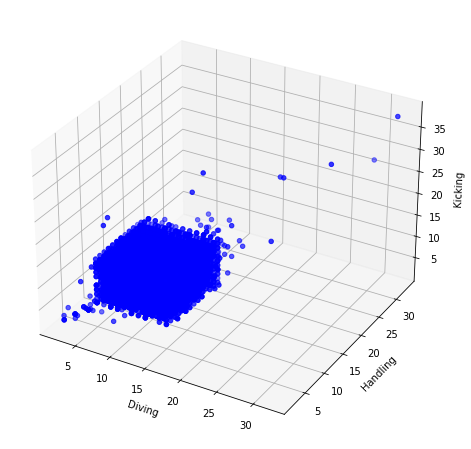

In [21]:
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(xs = df_no_GK.goalkeeping_diving,
           ys = df_no_GK.goalkeeping_handling,
           zs = df_no_GK.goalkeeping_kicking,
           color = random.choice(colores))
ax.set_xlabel('Diving')
ax.set_ylabel('Handling')
ax.set_zlabel('Kicking')
plt.show()

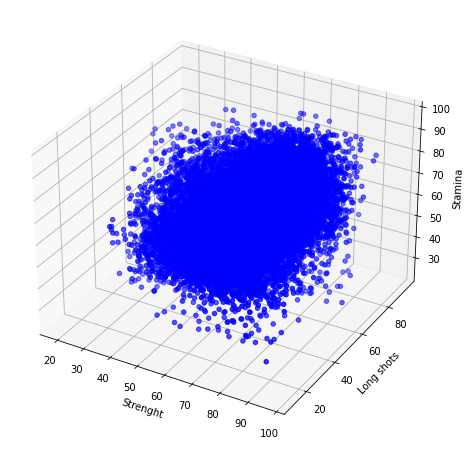

In [22]:
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(xs = df_no_GK.power_strength,
           ys = df_no_GK.power_long_shots,
           zs = df_no_GK.power_stamina,
           color = random.choice(colores))
ax.set_xlabel('Strenght')
ax.set_ylabel('Long shots')
ax.set_zlabel('Stamina')
plt.show()

Las variables que antes separaban, ahora ya no son capaces de formar dos grupos.

Pairplot sin arqueros.

In [23]:
# Identificación de categorías
attr_by_cat_1 = [[attribute.split(sep='_', maxsplit=1)[0], attribute] for attribute in attributes]
categories_1 = set([attribute[0] for attribute in attr_by_cat_1])

# Lista de diccionarios de datasets organizados por categoría
df_by_cat_1 = []
for cat in categories_1:
    attr = [x[1] for x in attr_by_cat_1 if cat in x]
    df_by_cat_1.append({'categoria': cat,
                      'dataset': df_no_GK[attr]})

0 - Pairplot de los atributos que corresponden a la categoría defending.


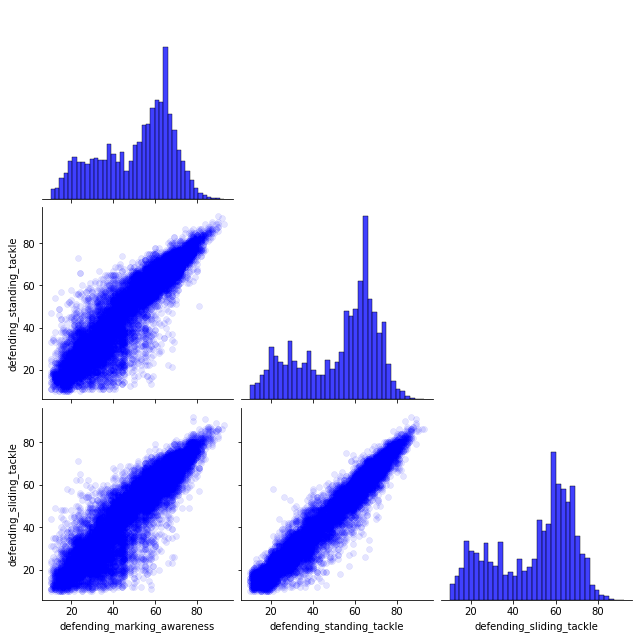

1 - Pairplot de los atributos que corresponden a la categoría power.


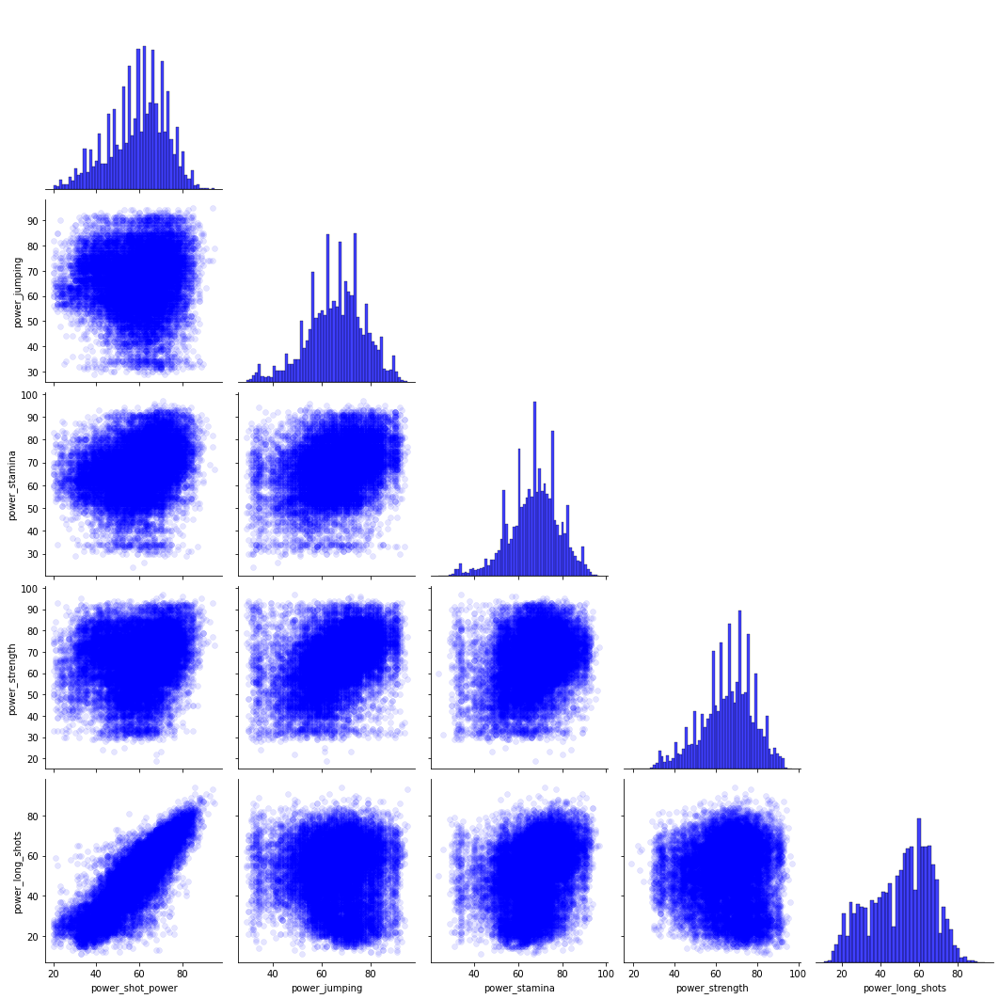

2 - Pairplot de los atributos que corresponden a la categoría mentality.


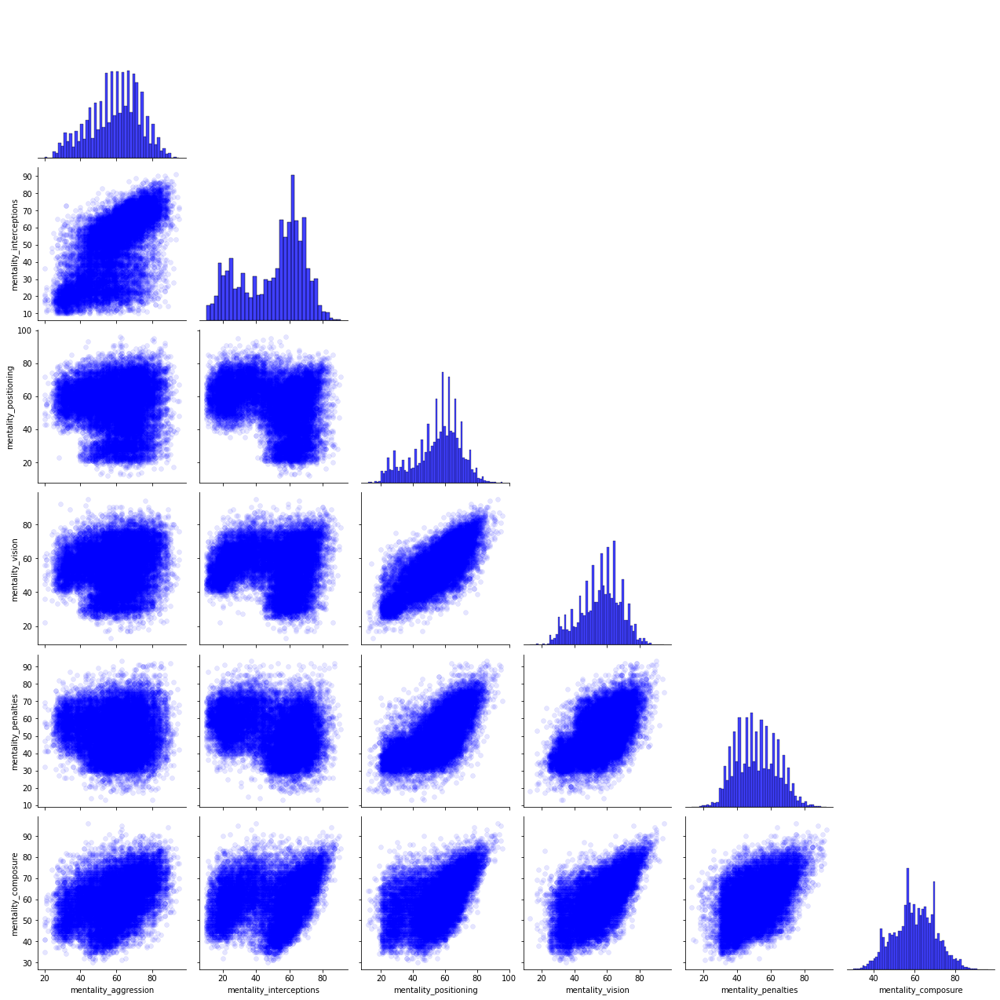

3 - Pairplot de los atributos que corresponden a la categoría movement.


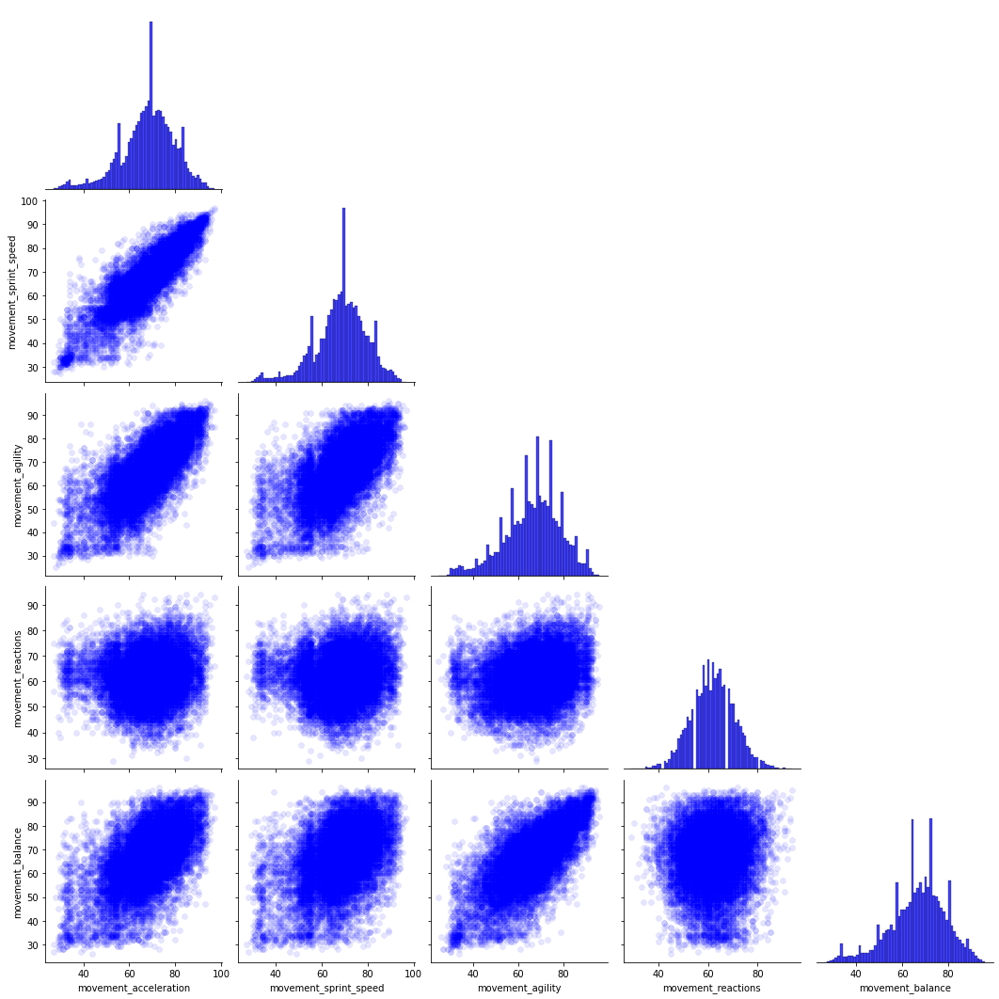

4 - Pairplot de los atributos que corresponden a la categoría skill.


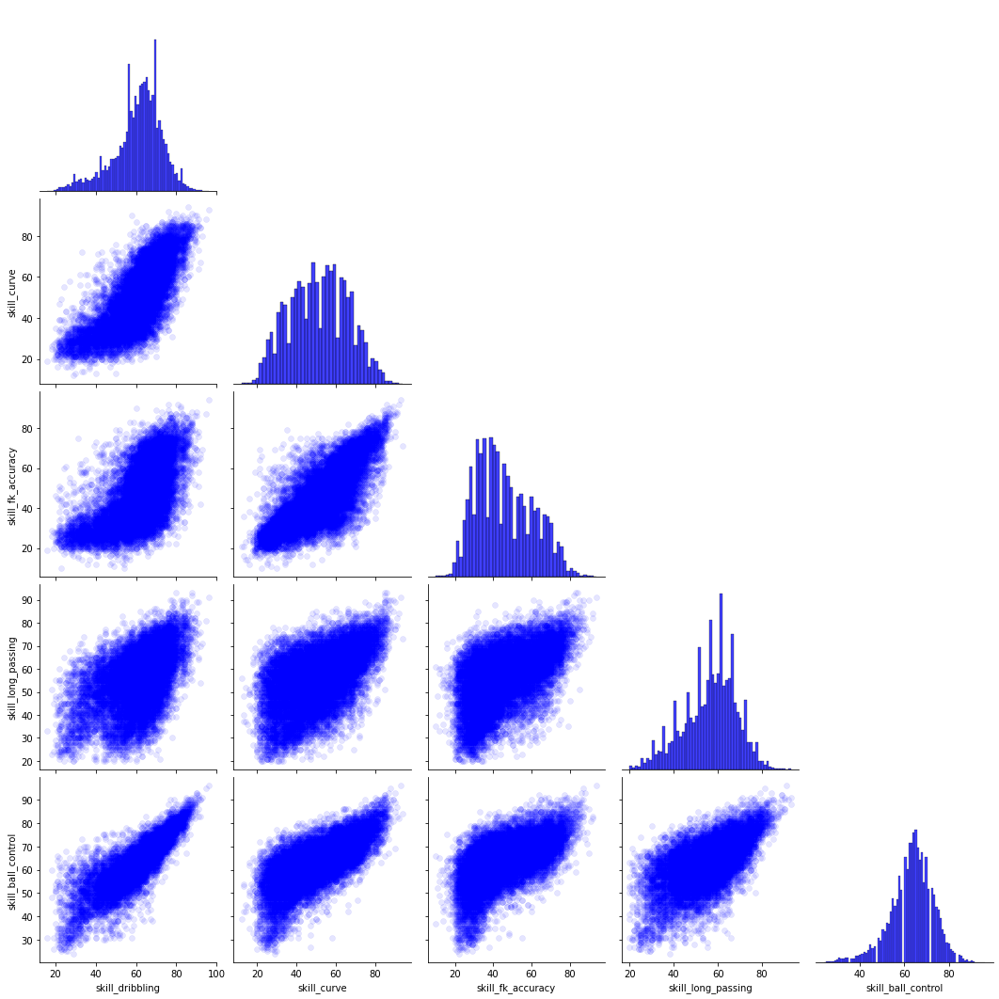

5 - Pairplot de los atributos que corresponden a la categoría goalkeeping.


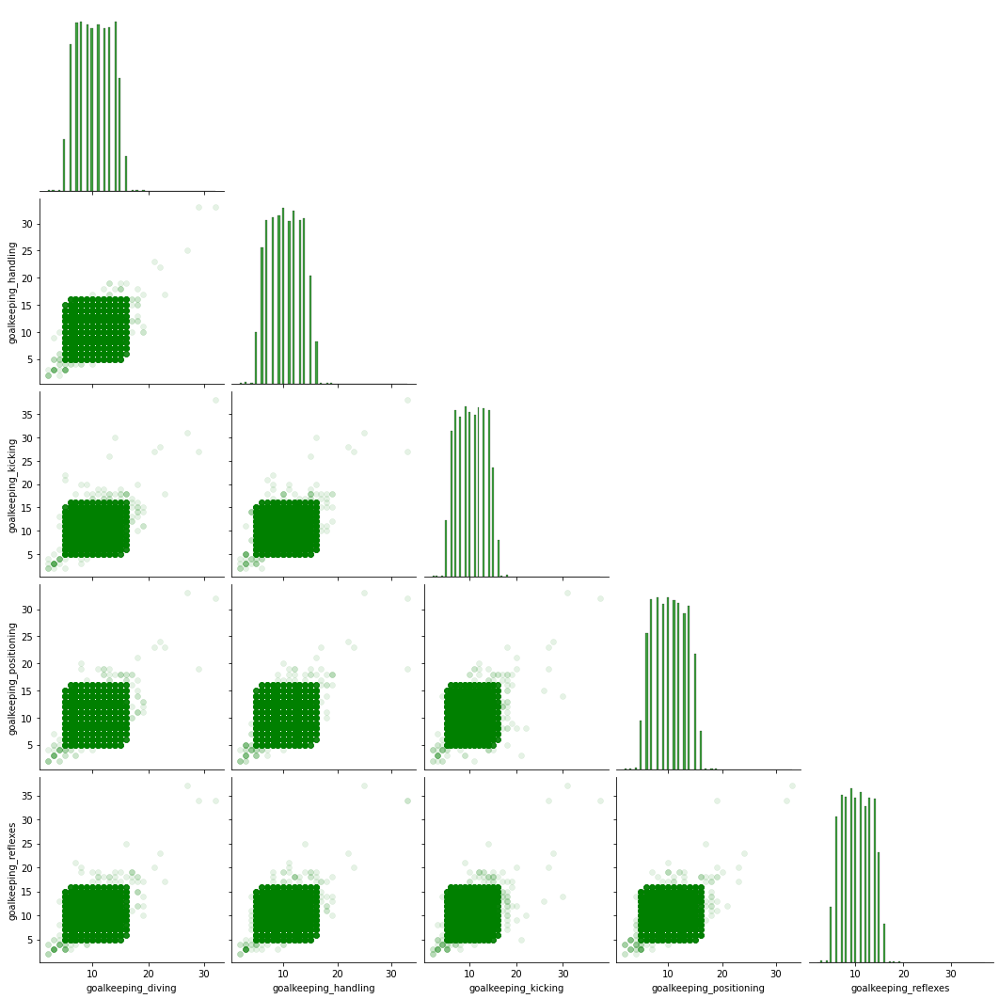

6 - Pairplot de los atributos que corresponden a la categoría attacking.


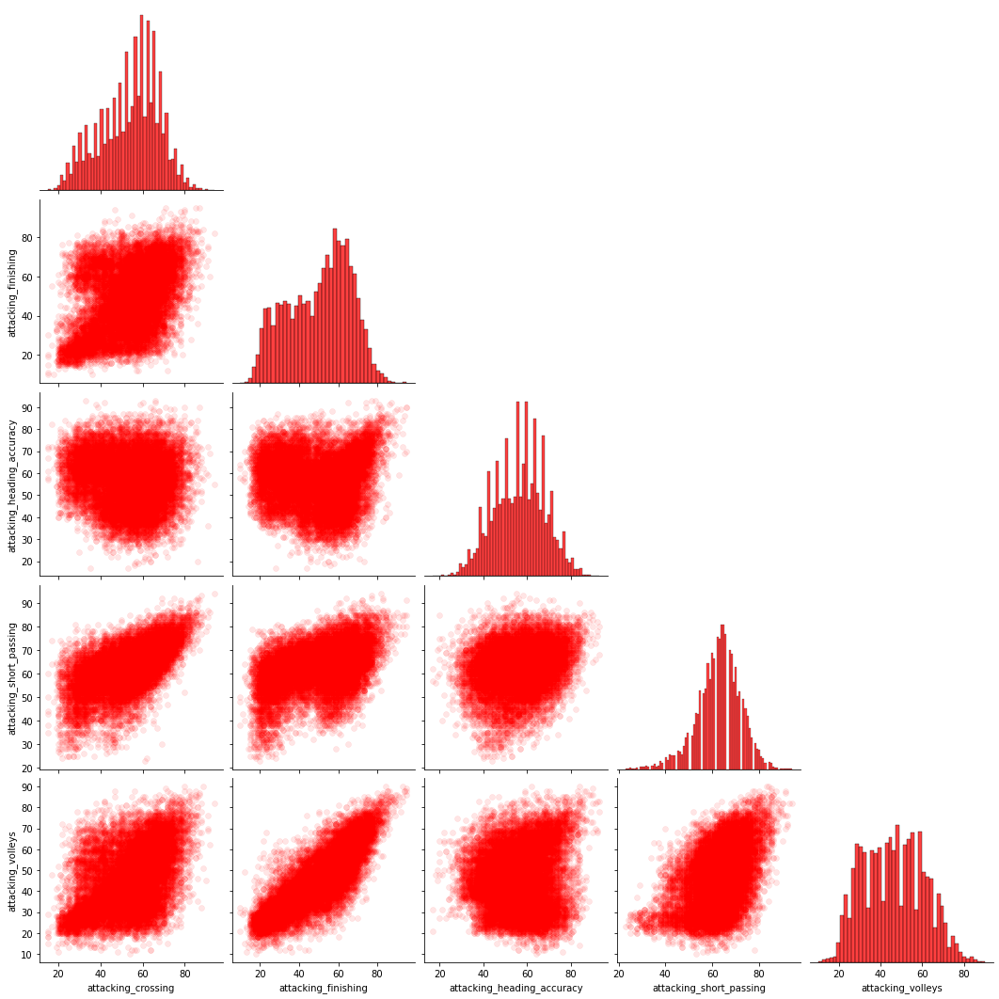

Wall time: 57.2 s


In [24]:
%%time
# Pairplots por categorías, sin arqueros
for i, dataset in enumerate(df_by_cat_1):
    print(f"{i} - Pairplot de los atributos que corresponden a la categoría {dataset['categoria']}.")
    color = random.choice(colores)
    sns.pairplot(dataset['dataset'],
                 height=3,
                 plot_kws={'alpha': 0.1, 'edgecolor': 'face', 'color': color},
                 diag_kws={'color': color},
                 corner=True)
    plt.show()

Notar que hay muchas variables que antes de hacer el filtrado tenían distribuciones bimodales claramente definidas y, posteriormente, luego de aplicar la máscara, no lo son. Por ejemplo `skill_dribbling`, `skill_ball_control`, `attacking_heading_accuracy`, `attacking_short_passing`, etc. Mirando los gráficos de dispersión asociados a ellas y sus pares, se ve que esta bimodalidad es la que ayuda a visualizar los dos clusters. Además las variables que presentan insesgamiento, como las asociadas a la categoría movement, también son candidatas en la formación de clusters.

Este filtrado puede ayudarnos a buscar variables que de apares intenten marcar una leve diferencia visual respecto a otras para realizar los análsis gráficos más adelante. En la categoría skill se puede ver que ball_control y long_passing podrían ser candidatas a analizar al imprementar KMeans o DBSCAN. También podríamos pensar en variables asociadas a la categoría movements como `sprint_speed` y `acceleration`. Estos pares son sólo ejemplos para guiar el análisis.

A continuación, se procedemos a achicar el dataset utizando la variable "Overall", para intentra encontrar nuevos clusters.

**Realizamos el histograma de la variable "Overall" (Desempeño global)**

Esta variable nos ayudará a reducir nuestro dataset de acuerdo a altos valores de desempeño.

In [25]:
df.overall.describe()

count    19239.000000
mean        65.772182
std          6.880232
min         47.000000
25%         61.000000
50%         66.000000
75%         70.000000
max         93.000000
Name: overall, dtype: float64

47


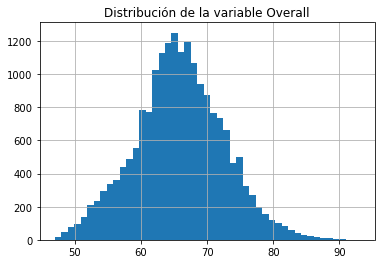

In [26]:
nbins=1*(df.overall.max()-df.overall.min())+1
df['overall'].hist(bins = nbins)
plt.title('Distribución de la variable Overall')
print(nbins)

La variable **'overall'** se calcula usando otras variables de desempeño del jugador (skills_ratings), utilizando redondeo

La variable 'overall' es numérica discreta, (pero de "naturaleza" continua) así como las otras de desempeño según habilidad ('attacking_crossing',
       'attacking_finishing', 'attacking_heading_accuracy', etc.), tomando valores enteros entre 0 y 100, más allá del tipo de dato en estos casos.
       
Miramos ahora los mejores jugadores por posicion, usando las variables 'overall' y 'player_positions'. 

**Mejores jugadores por posición**:

* GK – Goalkeeper - Guardameta
* SW – Sweeper – Libero defensivo
* LB – Left back – Lateral izquierdo
* CB – Centre-back - Central
* RB – Right back – Lateral derecho
* LWB – Left wing back – Carrilero izquierdo
* RWB – Right wing back – Carrilero derecho
* DM – Defensive Midfielder – Centrocampista defensivo
* CM – Centre Midfielder - Centrocampista
* AM – Attacking midfielder – Centrocampista ofensivo
* LM – Left midfielder – Volante izquierdo
* RM – Right midfielder – Volante derecho
* LW – Left winger – Extremo izquierdo
* SS – Second striker – Segundo delantero
* RW – Right winger – Extremo derecho
* CF – Centre forward – Delantero centro

In [27]:
best_players_per_position=df.iloc[df.groupby(df['player_positions'])['overall'].idxmax()][['player_positions','short_name','overall']].sort_values(by='overall', ascending=False)
best_players_per_position

,player_positions,short_name,overall
0,"RW, ST, CF",L. Messi,93
1,ST,R. Lewandowski,92
3,"LW, CAM",Neymar Jr,91
2,"ST, LW",Cristiano Ronaldo,91
5,GK,J. Oblak,91
...,...,...,...
18533,"LW, LWB, RW",L. Twamley,53
18763,"LWB, RB",M. Murphy,52
18895,"RW, ST, RB",O. van Hattum,51
19053,"ST, CM",Kang Jae Woo,50


**Conteos por posiciones**

In [28]:
pd.DataFrame(df.player_positions.value_counts().sort_index()).sort_values(by='player_positions', ascending=False)

,player_positions
CB,2423
GK,2132
ST,1770
"CDM, CM",953
CM,726
...,...
"CM, CDM, CF",1
"RB, RM, CAM",1
"CM, CB, CF",1
"CM, CAM, ST",1


**Mejores Promedios de Overall por equipos**

In [29]:
club_avg_overall=df.groupby("club_name")["overall"].mean().reset_index().sort_values("overall",ascending=False)
club_avg_overall.head(10)

,club_name,overall
368,Juventus,79.961538
470,Paris Saint-Germain,79.454545
358,Inter,78.857143
241,FC Bayern München,78.071429
412,Manchester United,78.000000
509,Real Madrid CF,77.757576
434,Napoli,77.500000
63,Atalanta,77.480000
512,Real Sociedad,77.280000
546,SL Benfica,76.931034


In [30]:
df_pca = df.copy() #antes de trabajar con la base copiamos para uso posterior

## 2.- Preparación de los datos a analizar

**Reducimos el tamaño de la base. Retiramos jugadores con bajo Desempeño global ("overall"),y consideramos Variables de desempeño por habilidad (skills_ratings)**

In [31]:
u=df[['overall', 'club_name', 'player_positions','short_name']] #anexo de variable necesario para el análisis

In [32]:
n=10000 #cantidad de jugadores a considerar

df_n=pd.concat([df_attributes, u], axis=1, ignore_index= False).loc[:n] #se reduce la base a los n primeros jugadores

df_n=df_n[(df_n['overall']>70)] #Se deja a los jugadores con overall mayor a 70

In [33]:
df_n['overall'].describe()

count    4593.000000
mean       74.755497
std         3.608341
min        71.000000
25%        72.000000
50%        74.000000
75%        76.000000
max        93.000000
Name: overall, dtype: float64

**Se crean el jugador perfecto y promedio para ver a donde se ubican en nuestra visualización**

Jugador perfecto

In [34]:
MachineGunDict={'short_name':'MachineGun','overall':99}
for skills in attributes:
    MachineGunDict[skills]=99
    
df_n=df_n.append(MachineGunDict,ignore_index=True)

Jugador promedio

In [35]:
JugadorPromedioDict={'Name':'JugadorPromedio','overall':df_n.overall.mean()}
for skills in attributes:
    JugadorPromedioDict[skills]=df_n[skills].mean()
    
df_n=df_n.append(JugadorPromedioDict,ignore_index=True)

In [36]:
df_n

,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,...,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,overall,club_name,player_positions,short_name,Name
0,85.000000,95.000000,70.000000,91.000000,88.000000,96.000000,93.000000,94.000000,91.00000,96.000000,...,6.000000,11.000000,15.000000,14.000000,8.000000,93.000000,Paris Saint-Germain,"RW, ST, CF",L. Messi,NaN
1,71.000000,95.000000,90.000000,85.000000,89.000000,85.000000,79.000000,85.000000,70.00000,88.000000,...,15.000000,6.000000,12.000000,8.000000,10.000000,92.000000,FC Bayern München,ST,R. Lewandowski,NaN
2,87.000000,95.000000,90.000000,80.000000,86.000000,88.000000,81.000000,84.000000,77.00000,88.000000,...,7.000000,11.000000,15.000000,14.000000,11.000000,91.000000,Manchester United,"ST, LW",Cristiano Ronaldo,NaN
3,85.000000,83.000000,63.000000,86.000000,86.000000,95.000000,88.000000,87.000000,81.00000,95.000000,...,9.000000,9.000000,15.000000,15.000000,11.000000,91.000000,Paris Saint-Germain,"LW, CAM",Neymar Jr,NaN
4,94.000000,82.000000,55.000000,94.000000,82.000000,88.000000,85.000000,83.000000,93.00000,91.000000,...,15.000000,13.000000,5.000000,10.000000,13.000000,91.000000,Manchester City,"CM, CAM",K. De Bruyne,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4590,70.000000,61.000000,49.000000,71.000000,29.000000,71.000000,74.000000,35.000000,69.00000,72.000000,...,12.000000,12.000000,11.000000,15.000000,9.000000,71.000000,Panathinaikos FC,"RB, RM",G. Kotsiras,NaN
4591,64.000000,74.000000,72.000000,63.000000,58.000000,66.000000,56.000000,49.000000,57.00000,65.000000,...,14.000000,15.000000,14.000000,12.000000,8.000000,71.000000,Cádiz CF,"ST, LM, RM",M. Osmajić,NaN
4592,57.000000,61.000000,54.000000,70.000000,61.000000,71.000000,60.000000,49.000000,74.00000,78.000000,...,13.000000,10.000000,10.000000,6.000000,9.000000,71.000000,Ferencvárosi TC,"CDM, CAM",S. Lončar,NaN
4593,99.000000,99.000000,99.000000,99.000000,99.000000,99.000000,99.000000,99.000000,99.00000,99.000000,...,99.000000,99.000000,99.000000,99.000000,99.000000,99.000000,NaN,NaN,MachineGun,NaN


## 3.- Exploratorio Visual para Clustering

**Consigna de trabajo:** Buscar agrupamientos de jugadores de manera intuitiva por cercanía (en espacios bidimensionales, de a dos variables por vez).

¿Que significa cercanía? ¿Cómo se mide? ¿En que espacio/s están buscando? 

La noción de cercanía hace referencia a similaridades entre las observaciones. En general, el nombre de distancia o disimilaridad entre dos individuos $i$ y $j$ es una medida, indicada por $d(i,j)$ , que mide el grado de semejanza entre ambos objetos o individuos, en relación a un cierto número de características cuantitativa y / o cualitativas. Intuitivamente, decimos que dos observaciones son disímiles si su cercanía no es alta y, al contrario, dos individuos son similares en cuanto a características si su cercanía es alta.

La cercanía la estamos buscando en un espacio 34 dimensional, aunque el análisis lo comencemos a realizar en 2D (o 3D) ya que es el método más sencillo para comenzar a aplicar el conocimiento de dominio. 


**Consigna de trabajo:** Visualizar a los jugadores (datos) usando las variables numéricas de a pares. ¿Emergen grupos/clusters?



Se visualizan los datos (jugadores) según sus habilidades es decir, en un espacio de 34 dimensional, comenzando de a dos variables numéricas por vez en función a lo que se vió en los pairplot sin arqueros.

In [38]:
for i, col in enumerate(attributes):
    print (f'{i} - {col}')

0 - attacking_crossing
1 - attacking_finishing
2 - attacking_heading_accuracy
3 - attacking_short_passing
4 - attacking_volleys
5 - skill_dribbling
6 - skill_curve
7 - skill_fk_accuracy
8 - skill_long_passing
9 - skill_ball_control
10 - movement_acceleration
11 - movement_sprint_speed
12 - movement_agility
13 - movement_reactions
14 - movement_balance
15 - power_shot_power
16 - power_jumping
17 - power_stamina
18 - power_strength
19 - power_long_shots
20 - mentality_aggression
21 - mentality_interceptions
22 - mentality_positioning
23 - mentality_vision
24 - mentality_penalties
25 - mentality_composure
26 - defending_marking_awareness
27 - defending_standing_tackle
28 - defending_sliding_tackle
29 - goalkeeping_diving
30 - goalkeeping_handling
31 - goalkeeping_kicking
32 - goalkeeping_positioning
33 - goalkeeping_reflexes


Se anlizan las variables de distintas categorías, por ejemplo, skill_ball_control (9) y mentality_interceptions(21), esta última sigue manteniendo una distribución bimodal incluso cuando el dataset no contiene a los arqueros.

In [39]:
#data=[]
bool_crack=df_n["overall"] > 85 #diferenciamos a los mejores jugadores

#Elegimos dos variables, para esto elegimos dos números entre 0 y n_skills-1 (entre 0 y 33)
skill_1=attributes[9]
skill_2=attributes[21]

In [40]:
graf = go.Scatter(x=df_n[skill_1],
                  y=df_n[skill_2],
                  mode='markers',
                  text=df_n.loc[:,'club_name'], #'Height', 'Weight', 'Club', 'Age', 'Name','Position'
                  marker=dict(size=5))

crack = go.Scatter(x=df_n.loc[bool_crack,skill_1],
                   y=df_n.loc[bool_crack,skill_2],
                   name='Top players',
                   text=df_n.loc[bool_crack,'short_name'],
                   textfont=dict(family='sans serif',size=10,color='black'),
                   opacity=0.9,
                   mode='text')

data = [graf, crack]

layout = go.Layout(title="Visualización de la base de a dos variables numéricas",
                   titlefont=dict(size=20),
                   xaxis=dict(title=skill_1),
                   yaxis=dict(title=skill_2),
                   autosize=False, width=1000,height=650)

fig = go.Figure(data=data, layout=layout)
fig.show()

El grupo de abajo corresponde, intuitivamente, a arqueros. Notar que se puede divisar una leve separación en dos grupos para los puntos que se encuentran a la derecha.

Notar el par que relaciona las categorías movement y defending. Se utiliza balance (14), que presenta un insesgamiento hacia la izquierda y sliding_tackle (28) la cual mantiene una distribución bimodal.

In [41]:
df_skills=df_n

In [42]:
#Elegimos dos variables, para esto elegimos dos números entre 0 y n_skills-1
skill_1=attributes[14]
skill_2=attributes[28]

In [43]:
graf1 = go.Scatter(x=df_skills[skill_1],
                   y=df_skills[skill_2],
                   mode='markers',
                   text=df_n.loc[:,'club_name'], #'Height', 'Weight', 'Club', 'Age', 'Name','Position'
                   marker={'size': 5})

crack = go.Scatter(x=df_skills.loc[bool_crack,skill_1],
                   y=df_skills.loc[bool_crack,skill_2],
                   name='Top players',
                   text=df_n.loc[bool_crack,'short_name'],
                   textfont=dict(family='sans serif',size=10,color='black'),
                   opacity=0.9,
                   mode='text')

data = [graf1, crack]

layout = go.Layout(title="Visualización de la base de a dos variables numéricas",
                   titlefont=dict(size=20),
                   xaxis=dict(title=skill_1),
                   yaxis=dict(title=skill_2),
                   autosize=False,
                   width=1000,
                   height=650)

fig = go.Figure(data=data, layout=layout)
fig.show()

Esta elección también puede sugerir 3 grupos.

En próxima gráfica, similar a la anterior, también se diferencian los mejores jugadores y alguna característica/variable de interés.

Se puede ubicar también un jugador en particular. Con la siguiente linea de comando, por ejemplo, Leo Messi: 

In [44]:
#Elegimos un jugador
recherche_joueur=df_n["short_name"]=='L. Messi' 

bool_crack=df_n["overall"] > 85
bool_elecc=df_n["player_positions"]=='GK' 
bool_no_crack=df_n["overall"]<86
bool_machinegun=df_n["short_name"]=='MachineGun'

#Elegir dos números entre 0 y n_skills-1
skill_1=attributes[5]  #5
skill_2=attributes[12]  #12

Gráfica con plotly

In [45]:
palette=['navy','red','#A2D5F2','orange','green','pink']  

data=[]

n_crack = go.Scatter(x=df_skills.loc[bool_crack,skill_1],
                     y=df_skills.loc[bool_crack,skill_2],
                     name='Crack',
                     text=df_n.loc[bool_crack,'short_name'],
                     textfont=dict(family='sans serif', size=15, color='black'),
                     opacity=0.9,
                     marker=dict(color=palette[2],size=7),
                     mode='markers+text')

n_no_crack = go.Scatter(x=df_skills.loc[bool_no_crack,skill_1],
                        y=df_skills.loc[bool_no_crack,skill_2],
                        name='Average player',
                        text=df_n.loc[bool_no_crack,'short_name'],
                        opacity=0.6,
                        marker=dict(color=palette[1],size=3),
                        mode='markers')

n_elecc = go.Scatter(x=df_skills.loc[bool_elecc,skill_1],
                     y=df_skills.loc[bool_elecc,skill_2],
                     name='Elección',
                     text=df_n.loc[bool_elecc,'short_name'],
                     opacity=0.6,
                     marker=dict(color=palette[0],size=5),
                     mode='markers')

n_machinegun = go.Scatter(x=df_skills.loc[bool_machinegun,skill_1],
                          y=df_skills.loc[bool_machinegun,skill_2],
                          name='Perfect player',
                          textfont=dict(family='sans serif',size=20,color='black'),
                          opacity=0.6,
                          marker=dict(color=palette[3],size=30),
                          mode='markers+text')

joueur_recherche = go.Scatter(x=df_skills.loc[recherche_joueur,skill_1],
                              y=df_skills.loc[recherche_joueur,skill_2],
                              name='Searched player',
                              text=df_n.loc[recherche_joueur,'short_name'],
                              textfont=dict(family='sans serif',size=20,color='black'),
                              opacity=1,
                              marker=dict(color=palette[4],size=40),
                              mode='markers+text')

data = [n_no_crack,
        n_elecc,
        n_crack,
        n_machinegun,
        joueur_recherche]

layout = go.Layout(title="Fifa Players",
                   titlefont=dict(size=20),
                   xaxis=dict(title=skill_1),
                   yaxis=dict(title=skill_2),
                   autosize=False,
                   width=1000,
                   height=650)

fig = go.Figure(data=data, layout=layout)
fig.show()

**Identificación de algunos jugadores por nombre**

In [46]:
print(df_n.loc[0:43,"short_name"])

0              L. Messi
1        R. Lewandowski
2     Cristiano Ronaldo
3             Neymar Jr
4          K. De Bruyne
5              J. Oblak
6             K. Mbappé
7              M. Neuer
8         M. ter Stegen
9               H. Kane
10             N. Kanté
11           K. Benzema
12          T. Courtois
13               H. Son
14             Casemiro
15          V. van Dijk
16              S. Mané
17             M. Salah
18              Ederson
19           J. Kimmich
20              Alisson
21        G. Donnarumma
22         Sergio Ramos
23            L. Suárez
24             T. Kroos
25            R. Lukaku
26             K. Navas
27          R. Sterling
28      Bruno Fernandes
29           E. Haaland
30            S. Agüero
31            H. Lloris
32            L. Modrić
33          Á. Di María
34          W. Szczęsny
35            T. Müller
36          C. Immobile
37             P. Pogba
38          M. Verratti
39           Marquinhos
40          L. Goretzka
41            P.

# EJERCICIO 3

Uso de dos técnicas de clustering: por ejemplo k-medias, DBSCAN, mezcla de Gaussianas y/o alguna jerárquica. Elección justificada de hiper-parámetros.

## K-medias (Kmeans)

En nuestros gráficos emergieron 3 clusters como máximo, sin embargo sabemos que puede haber más. Vamos a comenzar con un numero de cluster igual a 5 y luego optimizaremos este parámetro.

In [47]:
from sklearn.cluster import KMeans #,MeanShift
from sklearn import decomposition

n_clust =5 #Se selecciona el número de clusters.

km = KMeans(n_clusters=n_clust, random_state=10)
km.fit(df_skills[attributes]) #Se utiliza el df con las 34 dimensiones de habilidades para alimentar el algoritmo

clusters = km.labels_ # Etiquetas asignadas por el algoritmo, usaremos esta variable mas adelante en las gráficas
df_clusters=df_n.copy() #Se hace una copia del df con cantidad limitada de jugadores
df_clusters['kmeans_clust'] = km.labels_ #Se agrega la columna kmeans_clust para almacenar las etiquetas asignadas por el algoritmo
print('Nro Clusters encontrados: ', max(km.labels_)+1, 'clusters')
df_clusters.head(4)

Nro Clusters encontrados:  5 clusters


,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,...,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,overall,club_name,player_positions,short_name,Name,kmeans_clust
0,85.0,95.0,70.0,91.0,88.0,96.0,93.0,94.0,91.0,96.0,...,11.0,15.0,14.0,8.0,93.0,Paris Saint-Germain,"RW, ST, CF",L. Messi,NaN,4
1,71.0,95.0,90.0,85.0,89.0,85.0,79.0,85.0,70.0,88.0,...,6.0,12.0,8.0,10.0,92.0,FC Bayern München,ST,R. Lewandowski,NaN,2
2,87.0,95.0,90.0,80.0,86.0,88.0,81.0,84.0,77.0,88.0,...,11.0,15.0,14.0,11.0,91.0,Manchester United,"ST, LW",Cristiano Ronaldo,NaN,4
3,85.0,83.0,63.0,86.0,86.0,95.0,88.0,87.0,81.0,95.0,...,9.0,15.0,15.0,11.0,91.0,Paris Saint-Germain,"LW, CAM",Neymar Jr,NaN,4


In [48]:
bool_crack=df_n["overall"] > 85
bool_no_crack=df_n["overall"]<86

#Se elijen dos números entre 0 y n_skills-1
skill_1=attributes[14]
skill_2=attributes[28]

In [49]:
kmean_clusters = go.Scatter(x=df_skills[skill_1], y=df_skills[skill_2],
                           mode='markers',
                        text=df_n.loc[:,'short_name'],
                           marker=dict(
                                size=4,
                                color = clusters.astype(float), #para definir el color se utiliza la varibale clusters definida anteriormente.
                                colorscale='Portland',
                                showscale=False)
                           )

crack =go.Scatter(x=df_skills.loc[bool_crack,skill_1], y=df_skills.loc[bool_crack,skill_2],name='Ckacks',
                      text=df_n.loc[bool_crack,'short_name'],
                      textfont=dict(family='sans serif',size=10,color='black'),
                      opacity=0.9,mode='text')


data=[kmean_clusters,crack]

layout = go.Layout(title="Clusters K means",titlefont=dict(size=20),
                xaxis=dict(title=skill_1),
                yaxis=dict(title=skill_2),
                autosize=False, width=1000,height=650)

fig = go.Figure(data=data, layout=layout)
fig.show()

**Cantidad de observaciones por cluster**

In [50]:
group = df_clusters.groupby('kmeans_clust')['club_name'] #Se crea el grupo usando groupby
group.count() #Se realiza el conteo de las observaciones

kmeans_clust
0     900
1     439
2     569
3    1653
4    1007
Name: club_name, dtype: int64

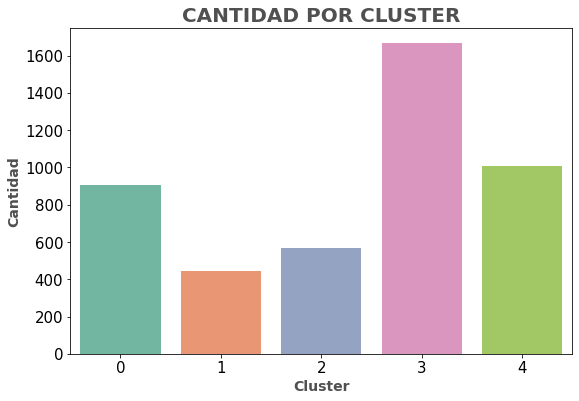

In [51]:
#Se procede a visualizar gráficamente
import seaborn as sns
fig = plt.figure(figsize=(9,6))
sns.countplot(data=df_clusters, x='kmeans_clust', palette= "Set2")

plt.title('CANTIDAD POR CLUSTER', loc= 'center', color= '#505050', fontsize=20, fontweight='bold')
plt.ylabel("Cantidad", size=14, fontweight='bold', color='#505050')
plt.xlabel("Cluster", size=14, fontweight='bold', color='#505050')

plt.xticks(fontsize=15, rotation=0)
plt.yticks(fontsize=15)
plt.show()

**Tabla de contingencia**

Se agrupan los jugadores en posiciones agrupadas para que sea más fácil e intuitiva la lectura de la tabla de contingencia.

In [52]:
#Se selecciona el primer campo en las posiciones del jugador
df_clusters["player_positions"].str.split(',').str[0]

0        RW
1        ST
2        ST
3        LW
4        CM
       ... 
4590     RB
4591     ST
4592    CDM
4593    NaN
4594    NaN
Name: player_positions, Length: 4595, dtype: object

In [53]:
forwards=['RF', 'ST', 'LW', 'LF', 'RS', 'LS', 'RM', 'LM','RW']
midfielders=['RCM','LCM','LDM','CAM','CDM','LAM','RDM','CM','RAM','CF']
defenders=['RCB','CB','LCB','LB','RB','RWB','LWB']
goalkeepers=['GK']

def pos2(position):
    if position in forwards:
        return 'Forward'
    
    elif position in midfielders:
        return 'Midfielder'
    
    elif position in defenders:
        return 'Defender'
    
    elif position in goalkeepers:
        return 'GK'
    
    else:
        return 'nan'

df_clusters["Position2"]=df_clusters["player_positions"].str.split(',').str[0].apply(lambda x: pos2(x))
df_clusters.head(5)

,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,...,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,overall,club_name,player_positions,short_name,Name,kmeans_clust,Position2
0,85.0,95.0,70.0,91.0,88.0,96.0,93.0,94.0,91.0,96.0,...,15.0,14.0,8.0,93.0,Paris Saint-Germain,"RW, ST, CF",L. Messi,NaN,4,Forward
1,71.0,95.0,90.0,85.0,89.0,85.0,79.0,85.0,70.0,88.0,...,12.0,8.0,10.0,92.0,FC Bayern München,ST,R. Lewandowski,NaN,2,Forward
2,87.0,95.0,90.0,80.0,86.0,88.0,81.0,84.0,77.0,88.0,...,15.0,14.0,11.0,91.0,Manchester United,"ST, LW",Cristiano Ronaldo,NaN,4,Forward
3,85.0,83.0,63.0,86.0,86.0,95.0,88.0,87.0,81.0,95.0,...,15.0,15.0,11.0,91.0,Paris Saint-Germain,"LW, CAM",Neymar Jr,NaN,4,Forward
4,94.0,82.0,55.0,94.0,82.0,88.0,85.0,83.0,93.0,91.0,...,5.0,10.0,13.0,91.0,Manchester City,"CM, CAM",K. De Bruyne,NaN,3,Midfielder


In [54]:
df_clusters.drop(df_clusters.loc[df_clusters['Position2']=='nan'].index, inplace=True) #borramos los casos nan para Position2.
df_clusters["Position2"].value_counts()

Defender      1485
Forward       1332
Midfielder    1332
GK             444
Name: Position2, dtype: int64

In [55]:
round(pd.crosstab(df_clusters.kmeans_clust, df_clusters.Position2, margins=True, normalize=True),2)

Position2,Defender,Forward,GK,Midfielder,All
kmeans_clust,,,,,
0,0.18,0.00,0.0,0.02,0.20
1,0.00,0.00,0.1,0.00,0.10
2,0.00,0.12,0.0,0.00,0.12
3,0.15,0.02,0.0,0.19,0.36
4,0.00,0.15,0.0,0.07,0.22
All,0.32,0.29,0.1,0.29,1.00


La tabla de contingencia permite interpretar que la probabilidad de que un jugador sea arquero (GK) dado que se encuentra en el cluster 1, es de un 10%. Notar que para este grupo las probabilidades condicionadas para el resto de las posiciones es nula, por lo que deduce que este cluster agrupa arqueros. 

Existe una probabilidad del 15% de un jugador que esté en el grupo 3 sea defensor pero, también hay un 19% de que en este cluster haya mediocampistas. Sin embargo, para esta última categóría (Midfielder) el porcentaje es el más grande (y con mucha diferencia) respecto al resto de los cluster para la misma posición por lo que se puede sospechar que en el kmeans_clust n°3 se encuentran los mediocampistas. Respecto a este mismo conglomerado y al cluster 0, se puede pensar que un jugador que se ubique en éste último tiene un 18% de probabilidad de ser defensor que, comparado con el 15% respecto al cluster 3, la diferencia no es tan significativa. Pero por descarte (ya que se asignó el cluster 3 a Midfielder), se sospecha que en kmeans_clust n°0 pueden predominar los defensores.

Por último en el cluster 2 y 4 pueden encontrarse los delanteros, sus probabilidades de pertenecer a esa posición dado que están en estos conglomerados son muy cercanas y no es posible asignarle con confianza el cluster 4 sólo por tener 2 puntos por encima del cluster 2.

Este análsis puede ayudar a pensar que el K a elegir para el modelo debería ser menor a 5 si se tienen en cuenta estas categorías intuitivas y generales.

**Elección de la cantidad de grupos/clusters**

Se evalúan las particiones realizadas mediante KMeans usando la inercia. La idea es que al variar el número de clúster K en el modelo, el valor de la distancia media de los datos al centroide más cercano va a variar.

Se grafica esa curva para elegir el número de particiones óptimos con el metodo del codo.

Text(0.5, 1.0, 'Inertia of k-Means versus number of clusters')

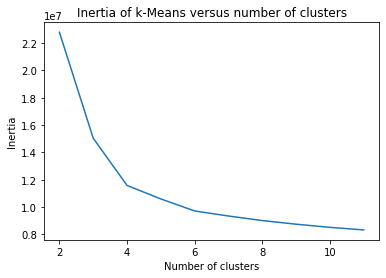

In [56]:
#Prueba: para elegir el hiperparámetro n_clusters, variando de 2 a 11 clusters
scores = [KMeans(n_clusters=i).fit(df_skills[attributes]).inertia_ for i in range(2,12)]

plt.plot(np.arange(2, 12), scores)
plt.xlabel('Number of clusters')
plt.ylabel("Inertia")
plt.title("Inertia of k-Means versus number of clusters")

El gráfico de inercia sugiere utilizar 4 clusters para ajustar los datos a la técnica K-Means.

Ajuste de los datos con KMeans utilizando K=4

In [57]:
n_clust_1 =4 #Se selecciona el número de clusters.

km_1 = KMeans(n_clusters=n_clust_1, random_state=10)
km_1.fit(df_skills[attributes]) #Se utiliza el df con las 34 dimensiones de habilidades para alimentar el algoritmo

clusters_1 = km_1.labels_ # Etiquetas asignadas por el algoritmo, usaremos esta variable mas adelante en las gráficas
df_clusters_1=df_n.copy() #Se hace una copia del df con cantidad limitada de jugadores
df_clusters_1['kmeans_clust'] = km_1.labels_ #Se agrega la columna kmeans_clust para almacenar las etiquetas asignadas por el algoritmo
print('Nro Clusters encontrados: ', max(km_1.labels_)+1, 'clusters')
df_clusters_1.head(4)

Nro Clusters encontrados:  4 clusters


,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,...,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,overall,club_name,player_positions,short_name,Name,kmeans_clust
0,85.0,95.0,70.0,91.0,88.0,96.0,93.0,94.0,91.0,96.0,...,11.0,15.0,14.0,8.0,93.0,Paris Saint-Germain,"RW, ST, CF",L. Messi,NaN,2
1,71.0,95.0,90.0,85.0,89.0,85.0,79.0,85.0,70.0,88.0,...,6.0,12.0,8.0,10.0,92.0,FC Bayern München,ST,R. Lewandowski,NaN,2
2,87.0,95.0,90.0,80.0,86.0,88.0,81.0,84.0,77.0,88.0,...,11.0,15.0,14.0,11.0,91.0,Manchester United,"ST, LW",Cristiano Ronaldo,NaN,2
3,85.0,83.0,63.0,86.0,86.0,95.0,88.0,87.0,81.0,95.0,...,9.0,15.0,15.0,11.0,91.0,Paris Saint-Germain,"LW, CAM",Neymar Jr,NaN,2


In [58]:
skill_1=attributes[14]
skill_2=attributes[28]

In [59]:
kmean_clusters = go.Scatter(x=df_skills[skill_1],
                            y=df_skills[skill_2],
                            mode='markers',
                            text=df_n.loc[:,'short_name'],
                            marker=dict(size=4,
                                        color=clusters_1.astype(float), #para definir el color se utiliza la varibale clusters definida anteriormente.
                                        colorscale='Portland',
                                        showscale=False))

crack = go.Scatter(x=df_skills.loc[bool_crack,skill_1],
                   y=df_skills.loc[bool_crack,skill_2],
                   name='Ckacks',
                   text=df_n.loc[bool_crack, 'short_name'],
                   textfont=dict(family='sans serif', size=10, color='black'),
                   opacity=0.9,
                   mode='text')

data = [kmean_clusters, crack]

layout = go.Layout(title="Clusters K means",
                   titlefont=dict(size=20),
                   xaxis=dict(title=skill_1),
                   yaxis=dict(title=skill_2),
                   autosize=False,
                   width=1000,
                   height=650)

fig = go.Figure(data=data, layout=layout)
fig.show()

Tabla de contingencia, con la misma metodología que se utilizaó para K=5.

In [60]:
df_clusters_1["Position2"]=df_clusters_1["player_positions"].str.split(',').str[0].apply(lambda x: pos2(x))
df_clusters_1.head(5)

,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,...,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,overall,club_name,player_positions,short_name,Name,kmeans_clust,Position2
0,85.0,95.0,70.0,91.0,88.0,96.0,93.0,94.0,91.0,96.0,...,15.0,14.0,8.0,93.0,Paris Saint-Germain,"RW, ST, CF",L. Messi,NaN,2,Forward
1,71.0,95.0,90.0,85.0,89.0,85.0,79.0,85.0,70.0,88.0,...,12.0,8.0,10.0,92.0,FC Bayern München,ST,R. Lewandowski,NaN,2,Forward
2,87.0,95.0,90.0,80.0,86.0,88.0,81.0,84.0,77.0,88.0,...,15.0,14.0,11.0,91.0,Manchester United,"ST, LW",Cristiano Ronaldo,NaN,2,Forward
3,85.0,83.0,63.0,86.0,86.0,95.0,88.0,87.0,81.0,95.0,...,15.0,15.0,11.0,91.0,Paris Saint-Germain,"LW, CAM",Neymar Jr,NaN,2,Forward
4,94.0,82.0,55.0,94.0,82.0,88.0,85.0,83.0,93.0,91.0,...,5.0,10.0,13.0,91.0,Manchester City,"CM, CAM",K. De Bruyne,NaN,0,Midfielder


In [61]:
df_clusters_1.drop(df_clusters_1.loc[df_clusters_1['Position2']=='nan'].index, inplace=True) #borramos los casos nan para Position2.
df_clusters_1["Position2"].value_counts()

Defender      1485
Forward       1332
Midfielder    1332
GK             444
Name: Position2, dtype: int64

In [62]:
#Tabla de contingencia k=4
round(pd.crosstab(df_clusters_1.kmeans_clust, df_clusters_1.Position2, margins=True, normalize=True),2)

Position2,Defender,Forward,GK,Midfielder,All
kmeans_clust,,,,,
0,0.14,0.03,0.0,0.20,0.38
1,0.00,0.00,0.1,0.00,0.10
2,0.00,0.26,0.0,0.06,0.32
3,0.18,0.00,0.0,0.02,0.20
All,0.32,0.29,0.1,0.29,1.00


Con 4 clusters las probabilidades condicionales siguen no siendo muy "competitivas" como para indicar que los defensores se encuentran en el cluster 0 o 3, aunque la diferencia en porcentaje es de 1 punto menos que en K=5. Sin embargo, para el resto de las categorias las probabilidades condicionales dan medidas más confiables para tomar decisiones respecto a qué tipo de jugadores se hallan en esos clusters.

Parece ser que lo más complicado de agrupar (separar) son los mediocampistas y los defensores.

Se analizará el cluster $0$ para analizar por qué mediocampistas y defensores caen en el mismo cluster.

Una hipótesis es que estos jugadores comparten características similares (ejemplo mediocampistas defensivos -CDM- y defensores centrales -CB-).

In [63]:
cluster_0=df_clusters_1[df_clusters_1['kmeans_clust'] == 0]

In [64]:
cluster_0[cluster_0['Position2']== 'Midfielder'].sample(15)

,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,...,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,overall,club_name,player_positions,short_name,Name,kmeans_clust,Position2
1154,63.0,59.0,58.0,74.0,63.0,69.0,68.0,59.0,75.0,72.0,...,9.0,13.0,6.0,76.0,F.C. København,"CDM, CM",Zeca,NaN,0,Midfielder
4196,50.0,56.0,58.0,76.0,47.0,63.0,62.0,66.0,73.0,66.0,...,9.0,12.0,11.0,71.0,Shandong Taishan,"CDM, CM",Son Jun Ho,NaN,0,Midfielder
1095,65.0,69.0,80.0,79.0,75.0,77.0,67.0,63.0,75.0,76.0,...,12.0,9.0,11.0,77.0,Juventus,"CM, RM, LM",W. McKennie,NaN,0,Midfielder
2787,69.0,68.0,63.0,76.0,68.0,77.0,73.0,68.0,73.0,79.0,...,9.0,7.0,8.0,73.0,Standard de Liège,"CM, CDM",S. Bastien,NaN,0,Midfielder
3057,50.0,54.0,54.0,72.0,56.0,72.0,58.0,63.0,69.0,75.0,...,10.0,7.0,13.0,73.0,Galatasaray SK,"CDM, CM",Gustavo Assunção,NaN,0,Midfielder
524,73.0,58.0,51.0,81.0,58.0,74.0,75.0,63.0,79.0,77.0,...,11.0,12.0,14.0,79.0,Tigres U.A.N.L.,"CDM, CM",Rafael Carioca,NaN,0,Midfielder
3793,54.0,63.0,54.0,75.0,58.0,76.0,62.0,57.0,71.0,72.0,...,6.0,14.0,10.0,72.0,RCD Mallorca,"CAM, RM, RW",Antonio Sánchez,NaN,0,Midfielder
3472,62.0,52.0,58.0,70.0,48.0,62.0,65.0,46.0,67.0,65.0,...,8.0,10.0,8.0,72.0,Lecce,"CDM, CM",A. Blin,NaN,0,Midfielder
3488,73.0,69.0,55.0,77.0,56.0,69.0,80.0,76.0,76.0,69.0,...,13.0,14.0,14.0,72.0,Club Bolívar,"CDM, CM, CB",Granell,NaN,0,Midfielder
1773,62.0,41.0,55.0,77.0,47.0,73.0,56.0,64.0,76.0,73.0,...,16.0,14.0,15.0,75.0,Stade Brestois 29,"CDM, CM",H. Belkebla,NaN,0,Midfielder


In [65]:
cluster_0[cluster_0['short_name']== 'K. De Bruyne'][['movement_balance','defending_sliding_tackle']]

,movement_balance,defending_sliding_tackle
4,78.0,53.0


En un muestreo aleatorio es posible observar que hay mayor proporción de mediocampistas con posiciones defensivas (CDM y CM) que de ofensivas (CAM).

In [71]:
cluster_0.loc[:, 'player_positions'] = cluster_0['player_positions'].astype(str)

In [72]:
cluster_0.player_positions.str.contains('CDM').mean()*100 

38.14492753623188

In [73]:
cluster_0.player_positions.str.contains('CM').mean()*100 

52.8695652173913

In [74]:
cluster_0.player_positions.str.contains('CAM').mean()*100 

15.710144927536232

De acuerdo a lo esperado, se puede observar que la mayoría los mediocampistas que pertenecen a este grupo con los defensores, tienen características defensivas, o bien son jugadores no ofensivos. Los de características ofensivas representan la menor proporción ($15\%$); se cree que este último grupo se encuentra en las fronteras o mezclándose con el cluster de los delanteros ($2$) tal como sucede con el jugador K. De Bruyne que tiene etiqueta CAM y coordenadas $(78,53)$ en el gráfico que se muestra en la sección "Cluster KMeans" con las variables movement_balance y defending_sliding_tackle.

## DBSCAN

In [75]:
from sklearn.preprocessing import normalize
from sklearn.cluster import DBSCAN
from scipy.spatial import distance
from sklearn.neighbors import NearestNeighbors

¿Cómo elegir los parámetros en DBSCAN?

Para elegir el parámetro epsilon, es decir, la distancia máxima a la que debe haber otra observación para considerar que cumple con el criterio de «estar cerca», es necesacio saber cuán cerca o lejos se encuentran las variables entre sí. Por lo general, habrá unas pocas variables que estarán muy cerca unas de otras y, a medida que aumenta la distancia, el número de variables cerca una de otras irá incrementando.

Para hacer la elección de $\epsilon$ se obtiene el gráfico de distancias usando el modelo Nearest Neighbors y se utiliza la técnica del codo. Esta técnica consiste en fijar un valor min_samples y, a partir de ahí, graficar todas los radios eps de los puntos ordenados por distancia, de forma que, cuando los radios comienzan a aumentar de forma exponencial (el codo de la curva) significa alejamiento de la zona de alta densidad (valores normales) y se entra en la zona de baja densidad (valores atípicos).

Respecto al mínimo de puntos a considerar en el cluster, distintas fuentes sugieren utilizar la misma cantidad (incluso el doble) de puntos de acuerdo a la cantidad de variables que se tiene en el dataset. Además se utiliza la distancia coseno del ángulo que forman dos vectores de observaciones.

**Elección de épsilon**

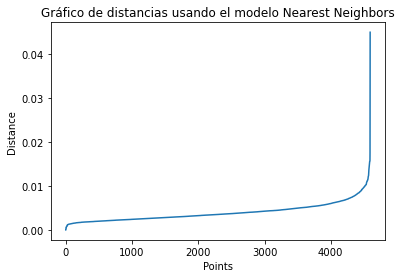

In [76]:
neigh = NearestNeighbors(n_neighbors=2, metric= 'cosine')
nbrs = neigh.fit(df_skills[attributes])
distances, indices = nbrs.kneighbors(df_skills[attributes])

# Clasificamos y representamos los resultados.
distances = np.sort(distances, axis=0)
distances = distances[:,1]

plt.xlabel("Points")
plt.ylabel("Distance")
plt.title('Gráfico de distancias usando el modelo Nearest Neighbors')
plt.plot(distances)
plt.show()

**Algoritmo DBSCAN**

In [77]:
db = DBSCAN(eps=0.01, min_samples=10, metric= 'cosine')

db.fit_predict(df_skills[attributes]) #Se utiliza el df con las 34 dimensiones de habilidades para alimentar el algoritmo

clusters_db = db.labels_ # Etiquetas asignadas por el algoritmo, usaremos esta variable mas adelante en las gráficas
df_clusters_db=df_n.copy() #Se hace una copia del df con cantidad limitada de jugadores
df_clusters_db['dbscan_clust'] = db.labels_ #Se agrega la columna dbscan_clust para almacenar las etiquetas asignadas por el algoritmo
print('Nro Clusters encontrados: ', max(db.labels_)+1, 'clusters')
df_clusters_db.head(4)

Nro Clusters encontrados:  3 clusters


,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,...,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,overall,club_name,player_positions,short_name,Name,dbscan_clust
0,85.0,95.0,70.0,91.0,88.0,96.0,93.0,94.0,91.0,96.0,...,11.0,15.0,14.0,8.0,93.0,Paris Saint-Germain,"RW, ST, CF",L. Messi,NaN,0
1,71.0,95.0,90.0,85.0,89.0,85.0,79.0,85.0,70.0,88.0,...,6.0,12.0,8.0,10.0,92.0,FC Bayern München,ST,R. Lewandowski,NaN,0
2,87.0,95.0,90.0,80.0,86.0,88.0,81.0,84.0,77.0,88.0,...,11.0,15.0,14.0,11.0,91.0,Manchester United,"ST, LW",Cristiano Ronaldo,NaN,0
3,85.0,83.0,63.0,86.0,86.0,95.0,88.0,87.0,81.0,95.0,...,9.0,15.0,15.0,11.0,91.0,Paris Saint-Germain,"LW, CAM",Neymar Jr,NaN,0


**Gráfico**

In [78]:
db_clusters = go.Scatter(x=df_skills[skill_1], y=df_skills[skill_2],
                        mode='markers',
                        text=df_n.loc[:,'short_name'],
                        marker=dict(
                                  size=4,
                                  color = clusters_db.astype(float), #para definir el color se utiliza la varibale clusters definida anteriormente.
                                  colorscale='Portland',
                                  showscale=False)
                           )

crack =go.Scatter(x=df_skills.loc[bool_crack,'movement_acceleration'], y=df_skills.loc[bool_crack,'skill_ball_control'],name='Ckacks',
                      text=df_n.loc[bool_crack,'short_name'],
                      textfont=dict(family='sans serif',size=10,color='black'),
                      opacity=0.9,mode='text')


data=[db_clusters,crack]

layout = go.Layout(title="Clusters DBSCAN",titlefont=dict(size=20),
                xaxis=dict(title=skill_1),
                yaxis=dict(title=skill_2),
                autosize=False, width=1000,height=650)

fig = go.Figure(data=data, layout=layout)
fig.show()

In [79]:
df_clusters_db["Position"]=df_clusters_db["player_positions"].str.split(',').str[0].apply(lambda x: pos2(x))
df_clusters_db.head(5)

,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,...,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,overall,club_name,player_positions,short_name,Name,dbscan_clust,Position
0,85.0,95.0,70.0,91.0,88.0,96.0,93.0,94.0,91.0,96.0,...,15.0,14.0,8.0,93.0,Paris Saint-Germain,"RW, ST, CF",L. Messi,NaN,0,Forward
1,71.0,95.0,90.0,85.0,89.0,85.0,79.0,85.0,70.0,88.0,...,12.0,8.0,10.0,92.0,FC Bayern München,ST,R. Lewandowski,NaN,0,Forward
2,87.0,95.0,90.0,80.0,86.0,88.0,81.0,84.0,77.0,88.0,...,15.0,14.0,11.0,91.0,Manchester United,"ST, LW",Cristiano Ronaldo,NaN,0,Forward
3,85.0,83.0,63.0,86.0,86.0,95.0,88.0,87.0,81.0,95.0,...,15.0,15.0,11.0,91.0,Paris Saint-Germain,"LW, CAM",Neymar Jr,NaN,0,Forward
4,94.0,82.0,55.0,94.0,82.0,88.0,85.0,83.0,93.0,91.0,...,5.0,10.0,13.0,91.0,Manchester City,"CM, CAM",K. De Bruyne,NaN,0,Midfielder


In [80]:
df_clusters_db.drop(df_clusters_db.loc[df_clusters_db['Position']=='nan'].index, inplace=True) #borramos los casos nan para Position.
df_clusters_db["Position"].value_counts()

Defender      1485
Forward       1332
Midfielder    1332
GK             444
Name: Position, dtype: int64

In [81]:
round(pd.crosstab(df_clusters_db.dbscan_clust, df_clusters_db.Position, margins=True, normalize=True),2)

Position,Defender,Forward,GK,Midfielder,All
dbscan_clust,,,,,
-1,0.01,0.00,0.01,0.00,0.02
0,0.32,0.29,0.00,0.29,0.89
1,0.00,0.00,0.08,0.00,0.08
2,0.00,0.00,0.00,0.00,0.00
All,0.32,0.29,0.10,0.29,1.00


Claramente, DBSCAN no está formando grupos interpretables. El cluster -1 se considera outlier y por lo tanto el 1 corresponde a arqueros y el cero al resto de las posiciones.

A continuación se ce lo que sucede si se filtra el dataset quitando a los arqueros.

In [82]:
df_db_no_GK= df_n[df_n['player_positions'] !='GK']
df_db_1=df_db_no_GK[attributes]

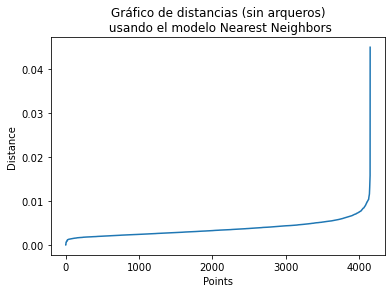

In [83]:
nbrs_1 = neigh.fit(df_db_1)
distances_1, indices_1 = nbrs_1.kneighbors(df_db_1)

# Clasificamos y representamos los resultados.
distances_1 = np.sort(distances_1, axis=0)
distances_1 = distances_1[:,1]

plt.title('Gráfico de distancias (sin arqueros)\n usando el modelo Nearest Neighbors')
plt.xlabel("Points")
plt.ylabel("Distance")
plt.plot(distances_1)
plt.show()

In [84]:
db_1 = DBSCAN(eps=0.01, min_samples=10, metric= 'cosine')

db_1.fit_predict(df_db_1) #Se utiliza el df con las 34 dimensiones de habilidades para alimentar el algoritmo

clusters_db_1 = db_1.labels_ # Etiquetas asignadas por el algoritmo, usaremos esta variable mas adelante en las gráficas
df_clusters_db_1=df_db_no_GK.copy() #Se hace una copia del df con cantidad limitada de jugadores
df_clusters_db_1['dbscan_clust'] = db_1.labels_ #Se agrega la columna dbscan_clust para almacenar las etiquetas asignadas por el algoritmo
print('Nro Clusters encontrados: ', max(db_1.labels_)+1, 'clusters')
df_clusters_db_1.head(4)

Nro Clusters encontrados:  1 clusters


,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,...,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,overall,club_name,player_positions,short_name,Name,dbscan_clust
0,85.0,95.0,70.0,91.0,88.0,96.0,93.0,94.0,91.0,96.0,...,11.0,15.0,14.0,8.0,93.0,Paris Saint-Germain,"RW, ST, CF",L. Messi,NaN,0
1,71.0,95.0,90.0,85.0,89.0,85.0,79.0,85.0,70.0,88.0,...,6.0,12.0,8.0,10.0,92.0,FC Bayern München,ST,R. Lewandowski,NaN,0
2,87.0,95.0,90.0,80.0,86.0,88.0,81.0,84.0,77.0,88.0,...,11.0,15.0,14.0,11.0,91.0,Manchester United,"ST, LW",Cristiano Ronaldo,NaN,0
3,85.0,83.0,63.0,86.0,86.0,95.0,88.0,87.0,81.0,95.0,...,9.0,15.0,15.0,11.0,91.0,Paris Saint-Germain,"LW, CAM",Neymar Jr,NaN,0


In [85]:
db_clusters = go.Scatter(x=df_db_1[skill_1],
                         y=df_db_1[skill_2],
                         mode='markers',
                         text=df_db_no_GK.loc[:,'short_name'],
                         marker=dict(size=4,
                                     color = clusters_db_1.astype(float), #para definir el color se utiliza la varibale clusters definida anteriormente.
                                     colorscale='Portland',
                                     showscale=False))

crack = go.Scatter(x=df_skills.loc[bool_crack,'movement_acceleration'],
                   y=df_skills.loc[bool_crack,'skill_ball_control'],
                   name='Ckacks',
                   text=df_n.loc[bool_crack,'short_name'],
                   textfont=dict(family='sans serif', size=10, color='black'),
                   opacity=0.9,
                   mode='text')

data = [db_clusters, crack]

layout = go.Layout(title="Clusters DBSCAN sin arqueros",
                   titlefont=dict(size=20),
                   xaxis=dict(title=skill_1),
                   yaxis=dict(title=skill_2),
                   autosize=False,
                   width=1000,
                   height=650)

fig = go.Figure(data=data, layout=layout)
fig.show()

# 4 Evaluación y Análisis de los clusters encontrados.

Debido a que las variables numéricas, a pesar de que son continuas, han sido discretizadas, el algoritmo DBSCAN no resulta ser una buena opción para realizar las agrupaciones que interesan. Por otro lado, debido a todo el análisis realizado con anterioridad con gráficos y tablas de contingencias, el algoritmo KMeans otorgó un buen resultado respecto a los clusters obtenidos. Con esto es posible afirmar que la mayoría de los jugadores que se esperaban encontrar en los clusters de defensores, mediocampistas, delanteros y arqueros, efectivamente lo estaban, salvo en los bordes de estos conglomerados.

# 5 ¿Se realizó alguna normalización o escalado de la base? ¿Por qué ?

No fue necesario; las variables utilizadas estaban en escala 0 - 100 en el dataset

# 6. Uso de alguna transformación (proyección, Embedding) para visualizar los resultados y/o usarla como preprocesado para aplicar alguna técnica de clustering.

Se utiliza PCA para visualizar la posible cantidad óptima de clusters para implementar, por ejemplo, en KMeans para el hiperparámetro K o para orientación en el caso de obtener clusters con DBSCAN (o cualquier otro algoritmo). Es decir, se utilizará Embedding como técnica de preprocesamiento antes de implementar un algoritmo.

Sin embargo, también es posible aprovechar PCA para encontrar correlaciones entre las primeras componentes obtenidas del Embedding y el resto de las variables del dataset. De este modo es posibel caracterizar a los individuos que se encuentran en cada cluster utilizando como guía las correlaciones de Pearson y, por el diagrama de dispersión que se haya obtenido con las dos (o tres) primeras componentes principales.

In [86]:
df_n["Position"]=df_n["player_positions"].str.split(',').str[0].apply(lambda x: pos2(x))
df_n.head(5)

,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,...,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,overall,club_name,player_positions,short_name,Name,Position
0,85.0,95.0,70.0,91.0,88.0,96.0,93.0,94.0,91.0,96.0,...,11.0,15.0,14.0,8.0,93.0,Paris Saint-Germain,"RW, ST, CF",L. Messi,NaN,Forward
1,71.0,95.0,90.0,85.0,89.0,85.0,79.0,85.0,70.0,88.0,...,6.0,12.0,8.0,10.0,92.0,FC Bayern München,ST,R. Lewandowski,NaN,Forward
2,87.0,95.0,90.0,80.0,86.0,88.0,81.0,84.0,77.0,88.0,...,11.0,15.0,14.0,11.0,91.0,Manchester United,"ST, LW",Cristiano Ronaldo,NaN,Forward
3,85.0,83.0,63.0,86.0,86.0,95.0,88.0,87.0,81.0,95.0,...,9.0,15.0,15.0,11.0,91.0,Paris Saint-Germain,"LW, CAM",Neymar Jr,NaN,Forward
4,94.0,82.0,55.0,94.0,82.0,88.0,85.0,83.0,93.0,91.0,...,13.0,5.0,10.0,13.0,91.0,Manchester City,"CM, CAM",K. De Bruyne,NaN,Midfielder


In [101]:
n_acp=18000

df_acp=df_n.loc[:n_acp]
df_acp=df_acp[(df_acp["Position"]!='GK')]

skills_ratings_no_GK = ['attacking_crossing', 'attacking_finishing', 'attacking_heading_accuracy',
                        'attacking_short_passing', 'attacking_volleys', 'skill_dribbling','skill_curve',
                        'skill_fk_accuracy',  'skill_long_passing', 'skill_ball_control',
                        'movement_acceleration', 'movement_sprint_speed', 'movement_agility',
                        'movement_reactions', 'movement_balance', 'power_shot_power',
                        'power_jumping', 'power_stamina', 'power_strength',
                        'power_long_shots', 'mentality_aggression', 'mentality_interceptions',
                        'mentality_positioning', 'mentality_vision', 'mentality_penalties',
                        'mentality_composure', 'defending_marking_awareness', 'defending_standing_tackle',
                        'defending_sliding_tackle']

In [88]:
X=df_acp[skills_ratings_no_GK] # Datos para proyectar
print('los datos tienen dimesión n= ',len(skills_ratings_no_GK))

los datos tienen dimesión n=  29


In [89]:
attributes_pca=X.columns
for i, col in enumerate(attributes_pca):
    print (f'{i} - {col}')

0 - attacking_crossing
1 - attacking_finishing
2 - attacking_heading_accuracy
3 - attacking_short_passing
4 - attacking_volleys
5 - skill_dribbling
6 - skill_curve
7 - skill_fk_accuracy
8 - skill_long_passing
9 - skill_ball_control
10 - movement_acceleration
11 - movement_sprint_speed
12 - movement_agility
13 - movement_reactions
14 - movement_balance
15 - power_shot_power
16 - power_jumping
17 - power_stamina
18 - power_strength
19 - power_long_shots
20 - mentality_aggression
21 - mentality_interceptions
22 - mentality_positioning
23 - mentality_vision
24 - mentality_penalties
25 - mentality_composure
26 - defending_marking_awareness
27 - defending_standing_tackle
28 - defending_sliding_tackle


**PCA**

In [90]:
pca=decomposition.PCA(n_components=4) #elegimos 2, 3 o 4 pero pueden ser más, 

pca.fit(X) 

# proporción de varianza
print('proporción de varianza por componente: ', pca.explained_variance_ratio_)
# proporción de varianza acumulada
print ('proporción de varianza por componente acumulada: ', pca.explained_variance_ratio_.cumsum())

X_projected=pca.transform(X) #numpy array
print ('tamaño de los datos: ', X_projected.shape)

proporción de varianza por componente:  [0.48051161 0.18103667 0.08969869 0.05220873]
proporción de varianza por componente acumulada:  [0.48051161 0.66154828 0.75124697 0.80345571]
tamaño de los datos:  (4151, 4)


In [91]:
proyecciones_df = pd.DataFrame(
    X_projected,
    columns =  ['PC1', 'PC2', 'PC3', 'PC4'],
    index   = X.index
)
proyecciones_df.head(5)

,PC1,PC2,PC3,PC4
0,-117.855053,37.026540,11.331541,5.798136
1,-85.310568,18.425246,47.262989,36.294208
2,-104.478677,12.737100,32.992202,40.713201
3,-103.751820,33.735914,-0.234317,9.194203
4,-55.832515,75.081891,26.099947,6.801538


In [92]:
proyecciones_df['Position']=df_n["Position"]

In [93]:
proyecciones_df

,PC1,PC2,PC3,PC4,Position
0,-117.855053,37.026540,11.331541,5.798136,Forward
1,-85.310568,18.425246,47.262989,36.294208,Forward
2,-104.478677,12.737100,32.992202,40.713201,Forward
3,-103.751820,33.735914,-0.234317,9.194203,Forward
4,-55.832515,75.081891,26.099947,6.801538,Midfielder
...,...,...,...,...,...
4590,26.525796,-0.288364,-37.268598,-4.472202,Defender
4591,-32.667687,-40.465109,4.799867,7.637745,Forward
4592,15.475966,6.824811,14.851604,-12.432686,Midfielder
4593,-36.992237,149.807982,45.030374,79.487865,nan


In [94]:
proyecciones_df.drop(proyecciones_df.loc[proyecciones_df['Position']=='nan'].index, inplace=True) #borramos los casos nan para Position

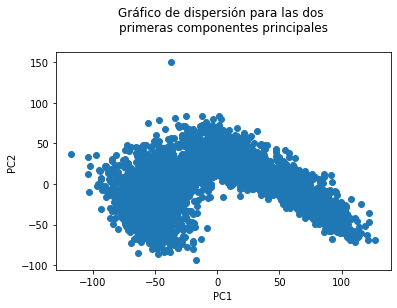

In [95]:
plt.scatter(X_projected[:,0], X_projected[:,1])
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('Gráfico de dispersión para las dos \nprimeras componentes principales\n')
plt.show()

Se pueden apreciar, aunque no con tanta claridad, distintos grupos. Utilizando la variable posición es posible indagar un poco más sobre estos posibles conglomerados.

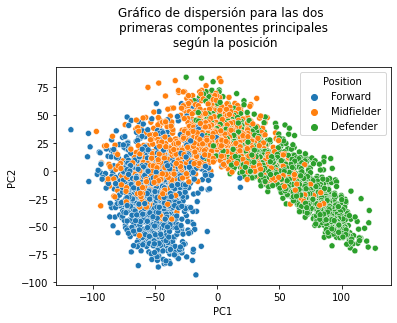

In [96]:
sns.scatterplot(data=proyecciones_df, x="PC1", y="PC2", hue='Position')
plt.title('Gráfico de dispersión para las dos \nprimeras componentes principales\n según la posición\n')
plt.show()

En una gráfica 2D no es posible apreciar con cierto grado de certeza que los grupos de interés estén en nubes de puntos diferenciadas.

En un gráfico 3D efectivamente es posible apreciar emergen 3 grupos por separado.

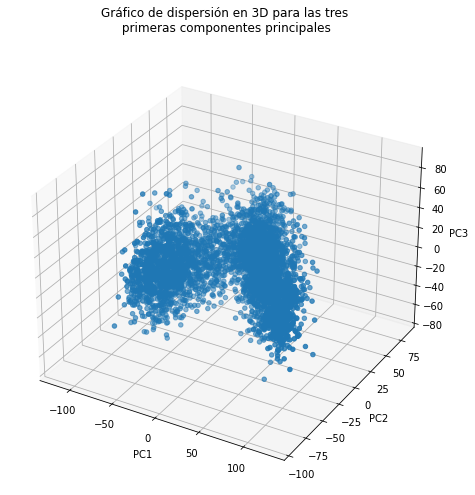

In [102]:
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(xs = proyecciones_df.PC1 ,
           ys = proyecciones_df.PC2,
           zs = proyecciones_df.PC3)
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')

plt.title('Gráfico de dispersión en 3D para las tres\n primeras componentes principales\n')
plt.show()

Este gráfico muestra con mayor certeza grupos distintos, sin embargo en la zona central puede observarse una nube de puntos con cierta profundidad.

Se utiliza nuevamente la variable posición para confirmar la posible presencia de un tercer grupo.

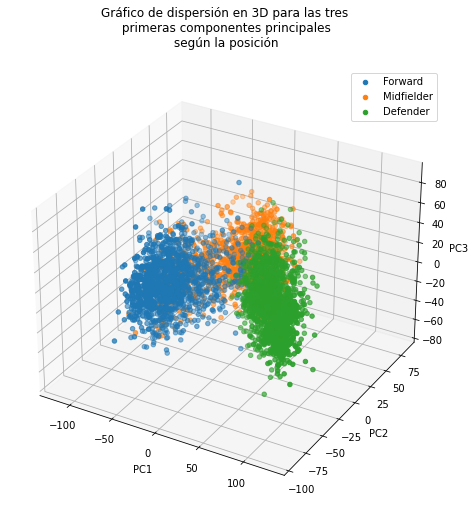

In [103]:
fig = plt.figure(figsize=(8, 8))

ax = fig.add_subplot(111, projection='3d')

ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')

plt.title('Gráfico de dispersión en 3D para las tres\n primeras componentes principales\n según la posición\n')

for s in proyecciones_df.Position.unique():
    ax.scatter(proyecciones_df.PC1[proyecciones_df.Position==s],proyecciones_df.PC2[proyecciones_df.Position==s],proyecciones_df.PC3[proyecciones_df.Position==s],label=s)
    
ax.legend()
plt.show()

Efectivamente, con el gráfico 3D es posible visualizar tres grupos, sin los arqueros.

El embedding, además de proporcionar una visualización respecto a los posibles grupos que pueden emerger en un algoritmo de clustering, también ayuda a dar sentido a esos conglomerados. Esto se puede pensar como un problema de análisis de correlación lineal entre las primeras componentes del PCA y el resto de las variables (numéricas) del dataset.

In [99]:
df_correlaciones=pd.concat([X, proyecciones_df[['PC1','PC2','PC3']]], axis=1, ignore_index= False)
df_correlaciones.head(5)

,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,...,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking_awareness,defending_standing_tackle,defending_sliding_tackle,PC1,PC2,PC3
0,85.0,95.0,70.0,91.0,88.0,96.0,93.0,94.0,91.0,96.0,...,93.0,95.0,75.0,96.0,20.0,35.0,24.0,-117.855053,37.026540,11.331541
1,71.0,95.0,90.0,85.0,89.0,85.0,79.0,85.0,70.0,88.0,...,95.0,81.0,90.0,88.0,35.0,42.0,19.0,-85.310568,18.425246,47.262989
2,87.0,95.0,90.0,80.0,86.0,88.0,81.0,84.0,77.0,88.0,...,95.0,76.0,88.0,95.0,24.0,32.0,24.0,-104.478677,12.737100,32.992202
3,85.0,83.0,63.0,86.0,86.0,95.0,88.0,87.0,81.0,95.0,...,86.0,90.0,93.0,93.0,35.0,32.0,29.0,-103.751820,33.735914,-0.234317
4,94.0,82.0,55.0,94.0,82.0,88.0,85.0,83.0,93.0,91.0,...,88.0,94.0,83.0,89.0,68.0,65.0,53.0,-55.832515,75.081891,26.099947


**Heatmap de correlación**

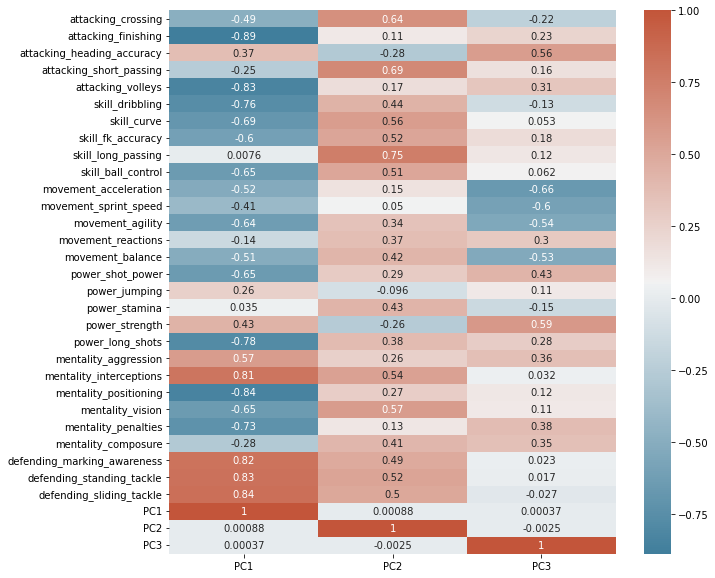

In [100]:
cmap = sns.diverging_palette(230, 20, as_cmap=True)
target_corr = pd.DataFrame(df_correlaciones.corr()[['PC1','PC2','PC3']], index=df_correlaciones.corr().index)

plt.figure(figsize=(10,10))
sns.heatmap(target_corr, annot=True, cmap=cmap)

plt.show()

En el heatmap de correlación se puede observar que las habilidades de defensa están positivamente correlacionadas con la componente principal PC1, es decir, valores altos de defending_marking_awareness, defending_standing_tackle y defending_sliding_tackle se corresponden con valores altos en la primera componente. Notar que para estas mismas variables los valores de correlación con la segunda componente no son tan bajos (aunque representan una fuerza de correlación bastante menor que la dada para PC1) por lo que es posible pensar que en PC2 los puntos que se corresponden a las variables de carácter defensivo se ubican en coordenadas con valores intermedios respecto a esta componente principal. Observar también que mentality_interceptions tiene una correlación positiva alta con la primer componente $(\rho=0.8)$, es decir, esta variable se corresponde con valores grandes en PC1. Observando nuevamente el gráfico de dispersión para las dos primeras componentes principales, es de esperar que estas habilidades se correspondan con jugadores en posición defensiva, tal como se ve en el conglomerado de puntos verdes.

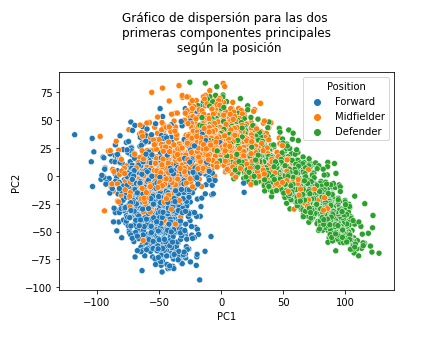

Por otro lado, es de esperar que los mediocampistas se encuentren en puntos donde la segunda componente tiene valores altos ya que, habilidades relacionadas con jugadores en esta posición tiene valores de correlación positiva con PC2. Por ejemplo, skill-short-passing tiene una correlación de $\rho=0.69$ y skill_long_passing de $\rho=0.75$; también habilidades de tipo mentales como mentality_vision tiene una correlación positiva, aunque con menor fuerza que las nombradas anteriormente. Cabe destacar que PC2 es la componente que más peso tiene para ubicar en el plano a los mediocampistas ya que, al menos en relación a estas features analizadas para esta posición, no se encuentra apoyo suficiente en el resto de las componentes. En lo que a "apoyo" se refiere, se hace hincapié en la fuerza de correlación ya sea positiva o negativa.

Por último, al observar el mapa de correlación se aprecia que hay muchas variables con correlación negativa respecto a la primera componente, siendo la mayoría asociadas a habilidades de delanteros (aunque algunas también se podrían asociar con mediocampistas). Notar que en particular, hay habilidades que están correlacionadas (con mayor o menor fuerza) de forma negativa con PC1 pero también, y de la misma forma, con PC3. Por ejemplo: movement_acceleration, movement_sprint_speed, movement_agility, movement_balance. Esto quiere decir que valores bajos en PC1 y PC3 se corresponden con valores altos de estas features. En el gráfico 3D presentado anteriormente se puede apreciar que estos puntos se corresponden a delanteros (a continuación se muestra el gráfico rotado para que sea visible esta comparación).

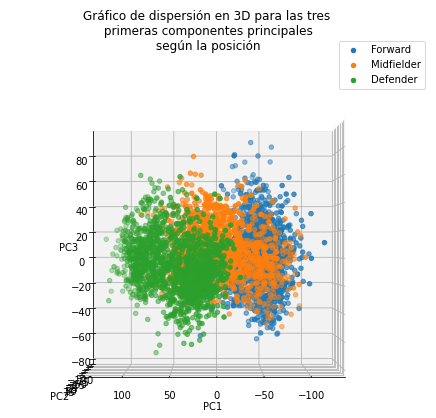